# Dataset : classic4.csv 
# Embeddings : Word2Vec

# Chargement des données et paramétrage de l'environnement

## Installations

In [ ]:
!pip install umap-learn
!pip install scikit-learn-extra
!pip install soyclustering
!pip install rpy2==3.5.1

## Import des librairies

In [ ]:
import os
import math
from tqdm import tqdm

# Data Science
import numpy as np
import pandas as pd
import re
import torch
from torch.utils.data import DataLoader
from scipy.sparse import csr_matrix
import tensorflow.compat.v1 as tf

# Graphiques
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

# Preprocessing
from sklearn.preprocessing import LabelEncoder

# NLP
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from gensim.models import Word2Vec

# Réduction de dimension
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

# Clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn_extra.cluster import KMedoids
from soyclustering import SphericalKMeans

# Métriques
from sklearn.metrics import accuracy_score, normalized_mutual_info_score, adjusted_rand_score

# R
%load_ext rpy2.ipython
import rpy2.robjects as robjects

In [ ]:
%%R

install.packages('NbClust')
install.packages('clustrd')
install.packages('aricode')

library(NbClust)
library(clustrd)
library(aricode)

## Fonctions

In [4]:
def data_preprocessing(text):
  '''
  Fonction permettant de nettoyer et préparer le texte
  pour les word embeddings
  '''
  text = re.sub(re.compile('<.*?>'), '', text) # supprimer les tags html
  text =  re.sub('[^A-Za-z0-9]+', ' ', text) # conserver les lettres et les chiffres
  text = text.lower() # mettre en miniscules
  tokens = nltk.word_tokenize(text) # tokenization
  text = [word for word in tokens if word not in stopwords.words('english')] # supprimer les stop words
  text = [WordNetLemmatizer().lemmatize(word) for word in text] # lemmatization
  text = ' '.join(text) # jointure des mots

  return text


def embed_w2v(text_vec, model):
  '''
  Fonction permettant de créer les embeddings Word2Vec
  '''
  placeholder_vec = np.zeros(model.vector_size)
  for text in text_vec:
    placeholder_vec = placeholder_vec + model.wv[text]

  return placeholder_vec / len(text_vec)


def clust_viz_2D(result, pred_labels):
  '''
  Fonction permettant de créer des graphiques 2D
  pour comparer les clusters prédits avec les vrais clusters
  '''
  # Dimensions
  dim1 = result[:, 0]
  dim2 = result[:, 1]

  # Création des graphiques des clusters sur 2 dimensions
  pred_colors = [dict_colors[i] for i in pred_labels]
  plt.figure(figsize = (7, 5))

  # Affichage des clusters prédits
  plt.subplot(1, 2, 1)
  plt.title("Clusters prédits")
  plt.scatter(x=dim1, y=dim2, c=pred_colors, alpha=0.2)

  # Affichage des vrais clusters
  plt.subplot(1, 2, 2)
  plt.title("Vrais clusters")
  plt.scatter(x=dim1, y=dim2, c=y_colors, alpha=0.2)
  plt.show()

def clust_viz_3D(result, pred_labels, elev1=10, azim1=45, elev2=10, azim2=45):
  '''
  Fonction permettant de créer des graphiques 2D
  pour comparer les clusters prédits avec les vrais clusters
  '''
  # Dimensions
  dim1 = result[:, 0]
  dim2 = result[:, 1]
  dim3 = result[:, 2]

  # Affichage des clusters prédits en 3D
  pred_colors = [dict_colors[i] for i in pred_labels]
  fig = plt.figure(figsize=(10, 10))
  ax = fig.add_subplot(1, 2, 1, projection='3d')
  ax.scatter(dim1, dim2, dim3, 
            marker='o', s=30, facecolor=pred_colors, alpha=0.2)
  ax.set_xlabel('Dim1')
  ax.set_ylabel('Dim2')
  ax.set_zlabel('Dim3')
  ax.view_init(elev=elev1, azim=azim1)
  plt.title('Clusters prédits')

  # Affichage des vrais clusters en 3D
  ax = fig.add_subplot(1, 2, 2, projection='3d')
  ax.scatter(dim1, dim2, dim3, 
            marker='o', s=30, facecolor=y_colors, alpha=0.2)
  ax.set_xlabel('Dim1')
  ax.set_ylabel('Dim2')
  ax.set_zlabel('Dim3')
  ax.view_init(elev=elev2, azim=azim2)
  plt.title('Vrais clusters')
  plt.draw()


def print_metrics(y_pred, y):
  '''
  Fonction permettant d'afficher les métriques 
  NMI, Accuracy et ARI
  '''
  print("NMI score: ", normalized_mutual_info_score(y_pred, y))
  print("Accuracy: ", accuracy_score(y_pred, y))
  print("ARI: ", adjusted_rand_score(y_pred, y))


class AutoEncoder(torch.nn.Module):
  def __init__(self, input_dim, embedding_dim):
    super().__init__()
    self.input_dim = input_dim
    self.embedding_dim = embedding_dim
    # Encoder : linear layer + ReLU activation function
    self.encoder = torch.nn.Sequential(
        torch.nn.Linear(self.input_dim, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, self.embedding_dim))
    # Decoder : linear layer + ReLU activation function   
    self.decoder = torch.nn.Sequential(
        torch.nn.Linear(self.embedding_dim, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, self.input_dim),
        torch.nn.Sigmoid()) # outputs between 0 and 1

  def forward(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
        
    return decoded

def autoencoder(X, 
                embedding_dim, 
                n_epochs=50, 
                batch_size=64, 
                learning_rate=1e-3, 
                weight_decay=1e-8, 
                seed=None, 
                return_model=False):
  # Utiliser le GPU si disponible
  if torch.cuda.is_available():
    device = 'cuda'
  else:
    device = 'cpu'
  # Seed
  if seed is not None:
    torch.manual_seed(seed)
  # Load
  dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
  # Instanciate model
  model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

  if device == 'cuda':
    model.cuda()
  # Loss function
  loss_function = torch.nn.MSELoss()
  # Optimizer
  optimizer = torch.optim.Adam(model.parameters(),
                               lr=learning_rate,
                               weight_decay=weight_decay)

  losses = []
  # Training
  model.train()
  for epoch in tqdm(range(n_epochs)):
    for batch in dataloader:
      batch = batch.to(device)
      reconstructed = model(batch)
        
      loss = loss_function(reconstructed, batch)
        
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
        
      losses.append(loss)
  # Evaluating
  model.eval()
  model.to("cpu")
  encoded_X = model.encoder(torch.tensor(X))
  encoded_X = encoded_X.detach().numpy()

  if return_model:
    return encoded_X, model, losses
  else:
    return encoded_X

In [5]:
# Deep K-means (DKM)
"""
Credits:
This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, 
                                units=dimension, 
                                activation=activation, 
                                name=name, 
                                reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
    The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

## Chargement des données et preprocessing

In [6]:
# Chargement du csv
df = pd.read_csv('/content/classic4.csv', index_col=0)
df.head()

,text,label
0,Computer-Aided Analysis and Design of Informat...,cacm
1,Milestones in Cataloging In the case of the pr...,cisi
2,childhood psychosis. a description is given of...,med
3,neonatal hepatitis or familial neonatal obstru...,med
4,Handbook of Comparative Librarianship The firs...,cisi


In [7]:
# Affichage du nombre de documents par groupe
df.groupby('label').count()

,text
label,
cacm,3204
cisi,1460
cran,1398
med,1033


In [8]:
# Nettoyage et préparation du texte pour les embeddings
df['text_clean'] = df['text'].apply(lambda x: data_preprocessing(x))

# Transformation du texte nettoyé en liste de tokens pour les embeddings
df['text_vec'] = [nltk.word_tokenize(text) for text in df['text_clean']]
df.head()

,text,label,text_clean,text_vec
0,Computer-Aided Analysis and Design of Informat...,cacm,computer aided analysis design information sys...,"[computer, aided, analysis, design, informatio..."
1,Milestones in Cataloging In the case of the pr...,cisi,milestone cataloging case present study dr leh...,"[milestone, cataloging, case, present, study, ..."
2,childhood psychosis. a description is given of...,med,childhood psychosis description given diagnost...,"[childhood, psychosis, description, given, dia..."
3,neonatal hepatitis or familial neonatal obstru...,med,neonatal hepatitis familial neonatal obstructi...,"[neonatal, hepatitis, familial, neonatal, obst..."
4,Handbook of Comparative Librarianship The firs...,cisi,handbook comparative librarianship first part ...,"[handbook, comparative, librarianship, first, ..."


In [9]:
# Séparation des documents et des clusters
X = df['text_vec']
y = df['label']

# Encodage des catégories en entier
y = LabelEncoder().fit_transform(y)

# Word2Vec

In [10]:
# Création du modèle Word2Vec
w2v_model = Word2Vec(X, min_count=1)
w2v_model.save("word2vec.bin")
print(w2v_model)

Word2Vec<vocab=22153, vector_size=100, alpha=0.025>


Le vocabulaire est composé de 22153 mots et le nombre de dimensions du vecteur est 100

In [11]:
# Création des embeddings Word2Vec
X_w2v = X.apply(lambda x: embed_w2v(x, w2v_model))

# Transformation en array (vecteur de dimension 100)
array_w2v = np.array(X_w2v.to_list())
array_w2v.shape

(7095, 100)

# Partie 1 : Approche Tandem

## Clustering sur l'espace d'origine

In [16]:
# Paramétrage des couleurs des classes pour les graphiques
dict_colors = {0: 'b', 1: 'g',  2: 'r', 3: 'y' } 
y_colors = [dict_colors[i] for i in y]

NMI score:  0.6217390545202337
Accuracy:  0.2036645525017618
ARI:  0.4666560361489524


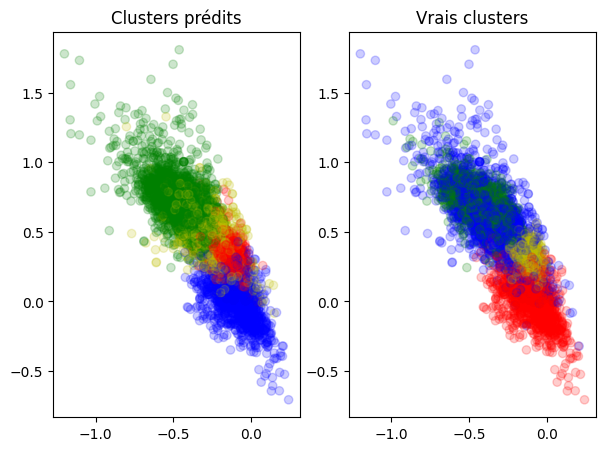

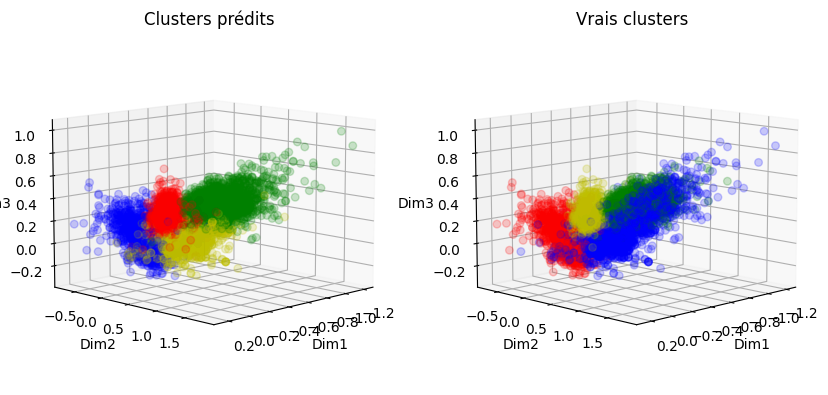

In [17]:
# KMeans++
kmeans = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=7)
kmeans.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, kmeans.labels_, elev1=10, azim1=45, elev2=10, azim2=45)

NMI score:  0.6377017790680297
Accuracy:  0.017054263565891473
ARI:  0.4766632646377012


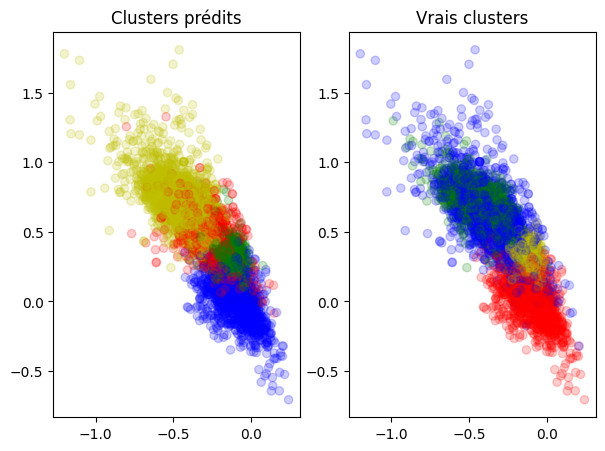

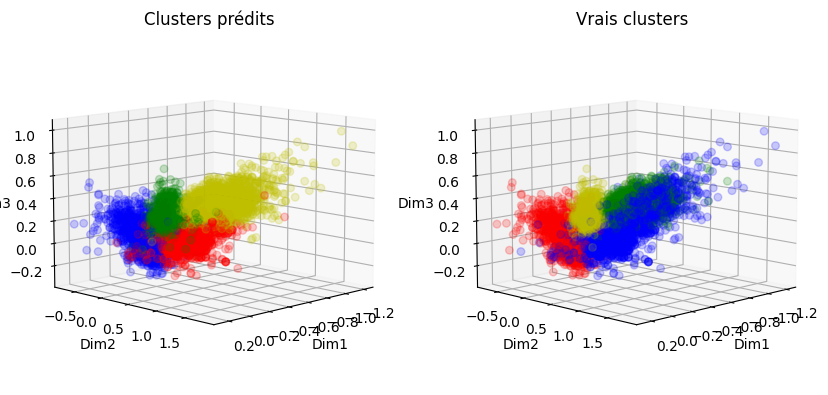

In [18]:
# KMedoids 
kmedoids = KMedoids(n_clusters=4, random_state=7)
kmedoids.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, kmedoids.labels_, elev1=10, azim1=45, elev2=10, azim2=45)

NMI score:  0.5180411540591325
Accuracy:  0.5916842847075405
ARI:  0.4103769253284477


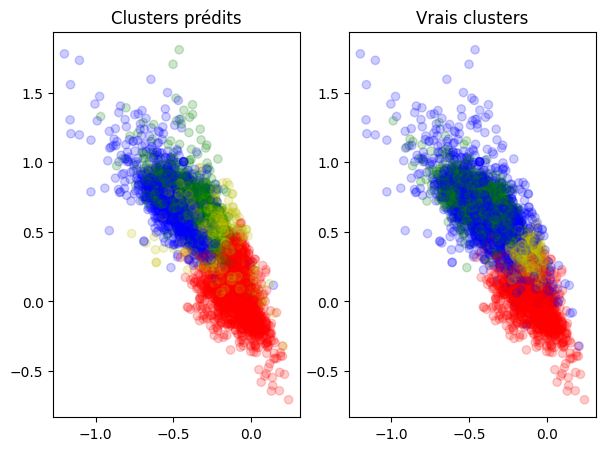

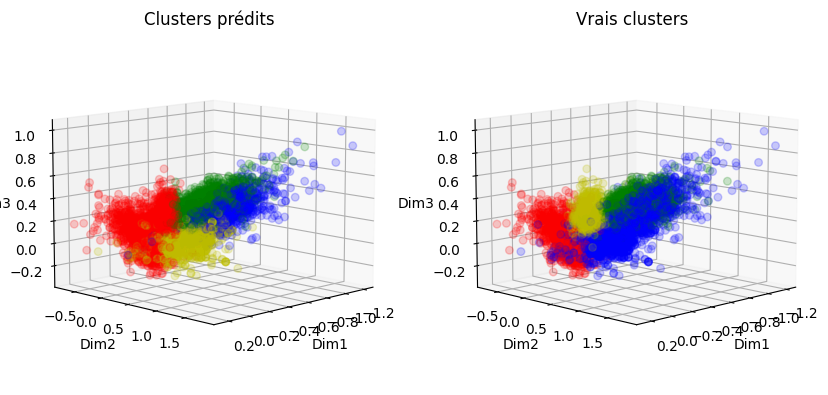

In [20]:
# Spherical KMeans
skmeans = SphericalKMeans(n_clusters=4, random_state=7)
skmeans.fit(csr_matrix(array_w2v))

# Evaluation de la qualité du clustering
print_metrics(skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, skmeans.labels_, elev1=10, azim1=45, elev2=10, azim2=45)

NMI score:  0.0005216849523584687
Accuracy:  0.4511627906976744
ARI:  -0.00035415950080903996


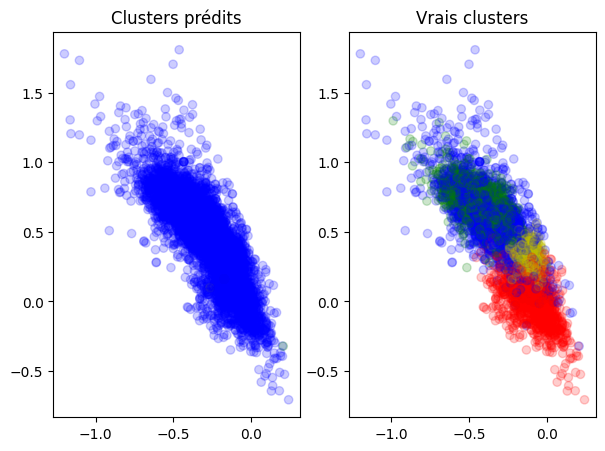

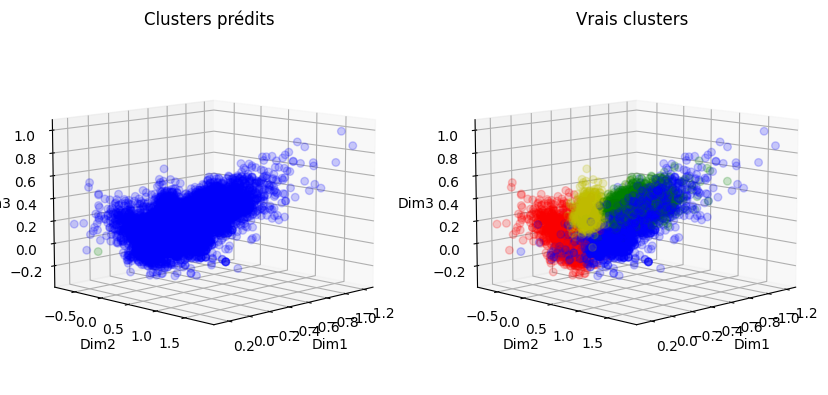

In [21]:
# HAC/CAH avec lien simple
hac_single = AgglomerativeClustering(n_clusters=4, linkage='single') 
hac_single.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_single.labels_, elev1=10, azim1=45, elev2=10, azim2=45)

NMI score:  0.44521711351390186
Accuracy:  0.34982381959126146
ARI:  0.3031088049590529


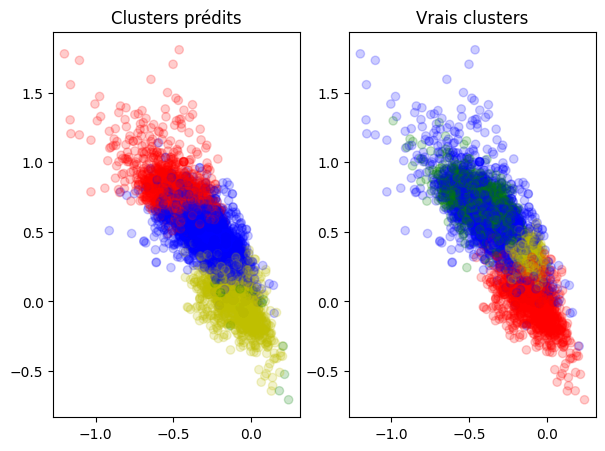

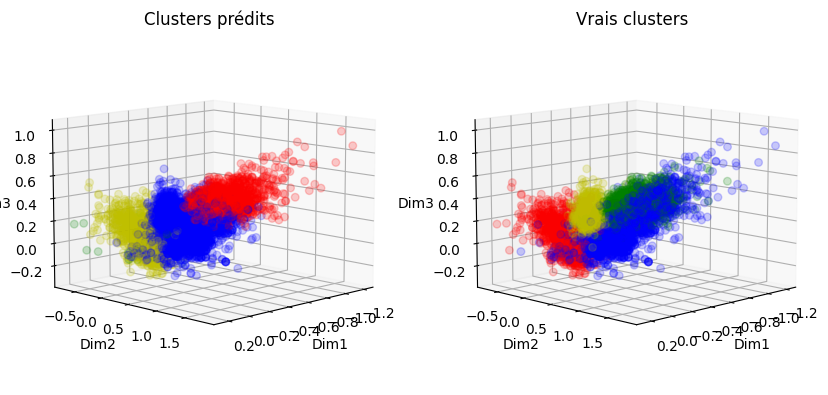

In [22]:
# HAC/CAH avec lien complet
hac_complete = AgglomerativeClustering(n_clusters=4, linkage='complete') 
hac_complete.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_complete.labels_, elev1=10, azim1=45, elev2=10, azim2=45)

NMI score:  0.44642400270240734
Accuracy:  0.427061310782241
ARI:  0.28535903763337844


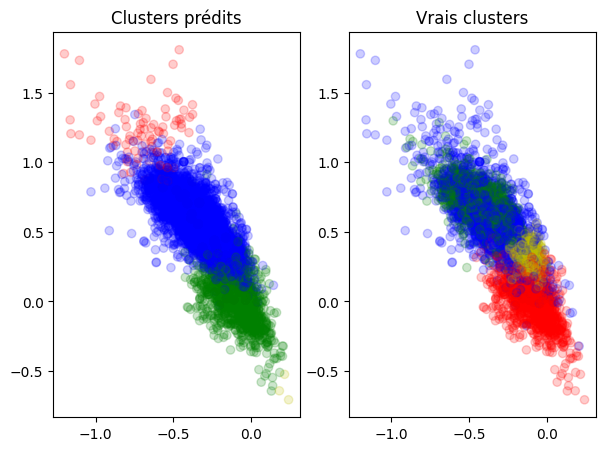

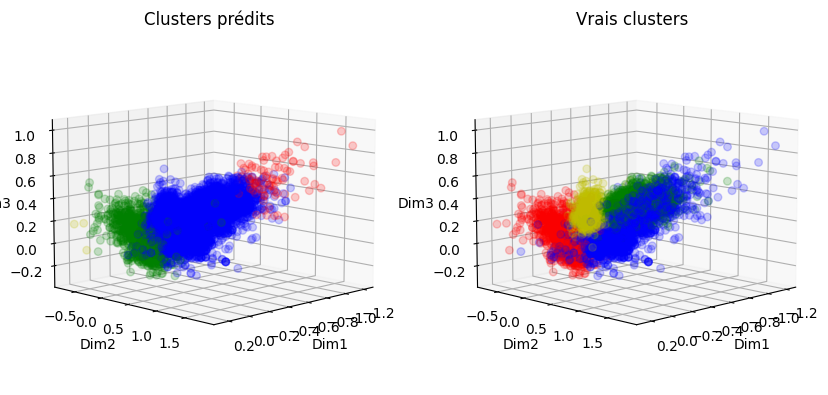

In [23]:
# HAC/CAH avec lien moyen
hac_avg = AgglomerativeClustering(n_clusters=4, linkage='average') 
hac_avg.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_avg.labels_, elev1=10, azim1=45, elev2=10, azim2=45)

NMI score:  0.6412119589240147
Accuracy:  0.3940803382663848
ARI:  0.47031796917640584


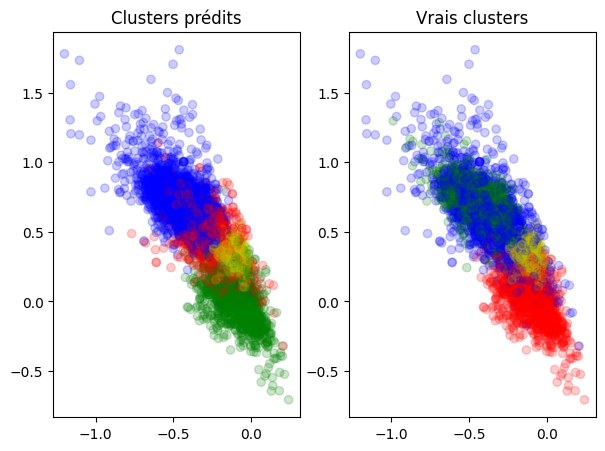

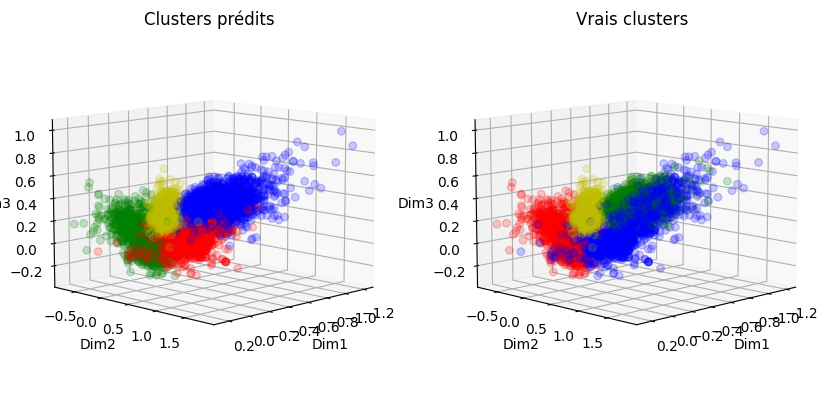

In [24]:
# HAC/CAH avec lien de Ward
hac_ward = AgglomerativeClustering(n_clusters=4, linkage='ward') 
hac_ward.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_ward.labels_, elev1=10, azim1=45, elev2=10, azim2=45)

Dans l'espace d'origine les données ont une forme allongé et sont concentrées. Les différentes méthodes n'arrivent pas à trouver de bons clusters.

## Clustering après réduction de dimension

### PCA

PC1     45.839796
PC2     21.056516
PC3     18.882506
PC4      4.904927
PC5      2.877375
PC6      1.836574
PC7      1.189829
PC8      1.015686
PC9      0.596040
PC10     0.342191
dtype: float64


<Axes: xlabel='Principal components', ylabel='Explained variance'>

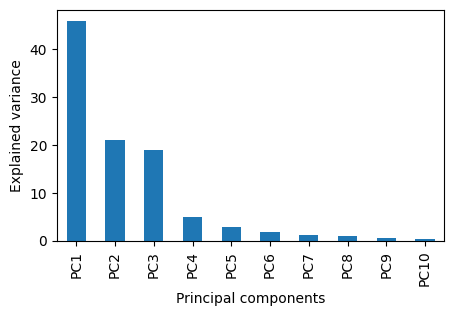

In [25]:
# Réduction de dimension avec PCA
pca = PCA(random_state=7)
pca_result = pca.fit_transform(array_w2v)

# Conversion des résultats en dataframe
pca_columns = ['PC' + str(c) for c in range(1, pca_result.shape[1]+1, 1)]
df_pca = pd.DataFrame(pca_result, index=X_w2v.index, columns=pca_columns) 

# Affichage  du pourcentage de variance expliquée par les 10 premières composantes principales
explained_variance = pd.Series(dict(zip(df_pca.columns, 100.0*pca.explained_variance_ratio_)))
print(explained_variance[0:10])
explained_variance[0:10].plot(kind='bar', figsize=(5, 3), rot=90, ylabel='Explained variance', xlabel='Principal components')

Les trois premières composantes expliquent 85% de la variance. La méthode du coude recommande de poursuivre avec ces trois composantes.



<Axes: xlabel='PC1', ylabel='PC2'>

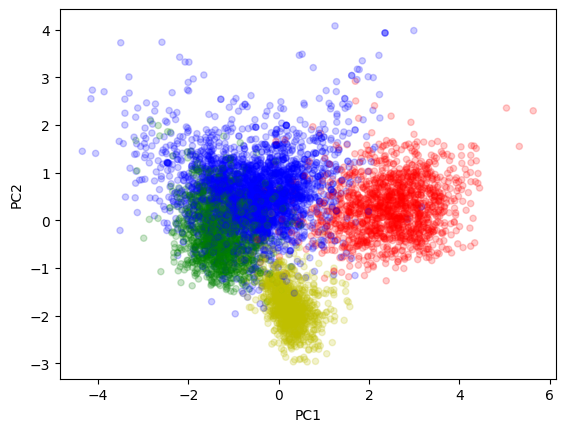

In [26]:
# Réduction de dimension avec PCA
pca = PCA(n_components=3, random_state=7)
pca_result = pca.fit_transform(array_w2v)

# Conversion des résultats en dataframe
pca_columns = ['PC' + str(c) for c in range(1, pca_result.shape[1]+1, 1)]
df_pca = pd.DataFrame(pca_result, index=X_w2v.index, columns=pca_columns)

# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_pca.plot(x='PC1', y='PC2', kind='scatter', color=y_colors, alpha=0.2)

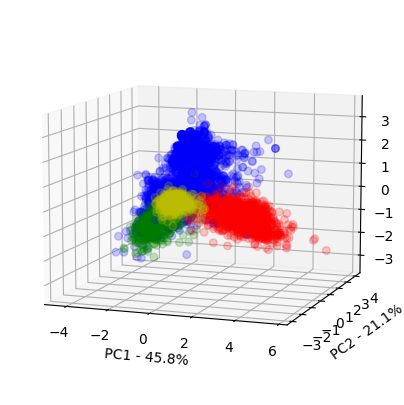

In [27]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('PC1 - ' + '{:.1f}%'.format(explained_variance['PC1']))
ax.set_ylabel('PC2 - ' + '{:.1f}%'.format(explained_variance['PC2']))
ax.set_zlabel('PC3 - ' + '{:.1f}%'.format(explained_variance['PC3']))
ax.view_init(elev=10, azim=-70)

Les groupes sont mieux séparés mais les groupes 0 (bleu) et 1 (vert) restent difficiles à distinguer.

NMI score:  0.6180981939168434
Accuracy:  0.014799154334038054
ARI:  0.4643767836803167


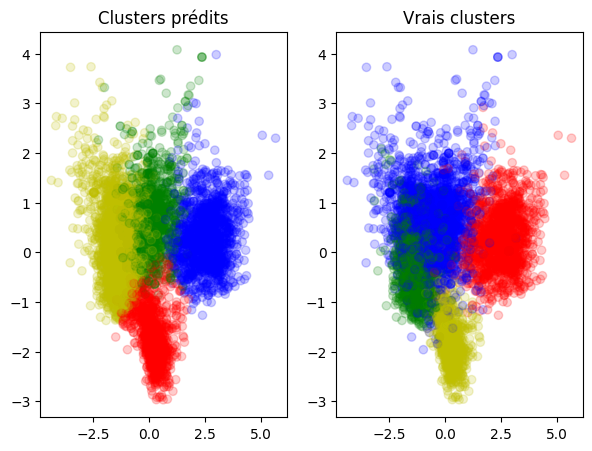

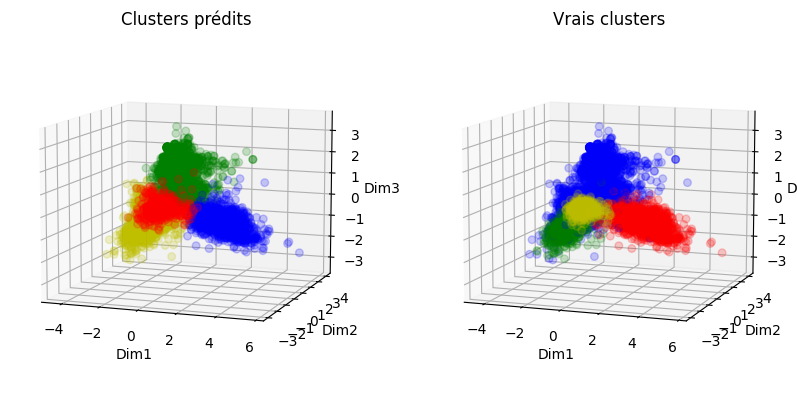

In [28]:
# KMeans++
pca_kmeans = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=7)
pca_kmeans.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_kmeans.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.6298011233472466
Accuracy:  0.2350951374207188
ARI:  0.46922306226118216


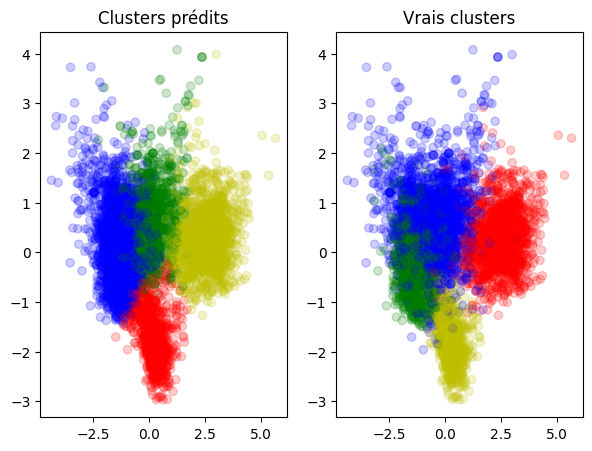

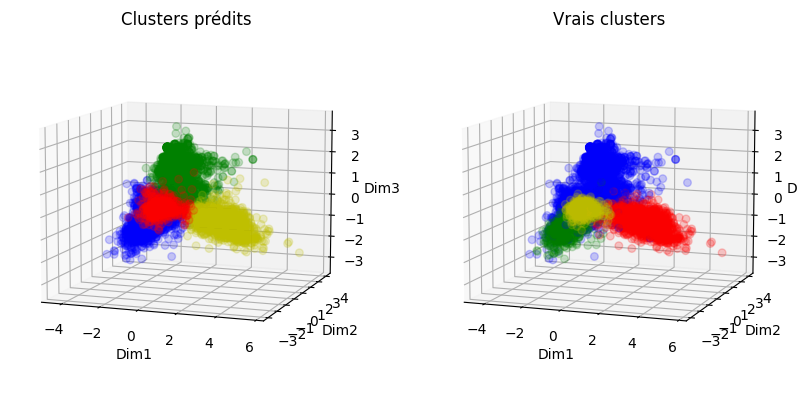

In [29]:
# KMedoids 
pca_kmedoids = KMedoids(n_clusters=4, random_state=7)
pca_kmedoids.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_kmedoids.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.5971421345602467
Accuracy:  0.2229739252995067
ARI:  0.45200865732576995


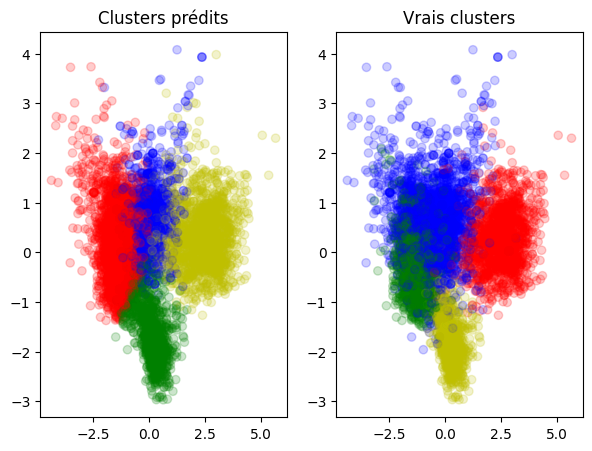

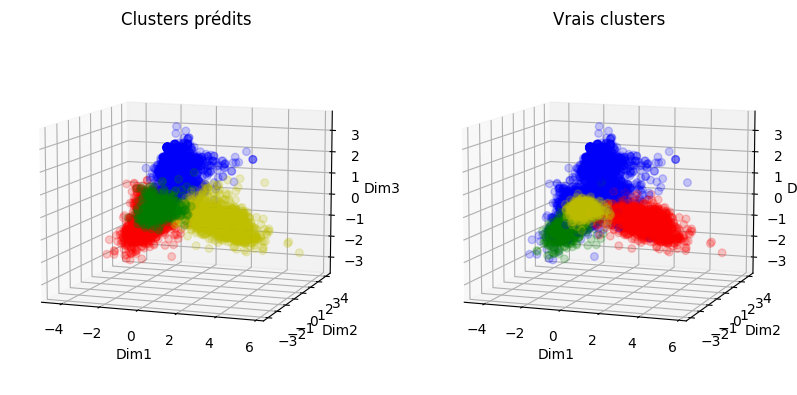

In [30]:
# Spherical KMeans
pca_skmeans = SphericalKMeans(n_clusters=4, random_state=7)
pca_skmeans.fit(csr_matrix(pca_result))

# Evaluation de la qualité du clustering
print_metrics(pca_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_skmeans.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.0005216849523584687
Accuracy:  0.4511627906976744
ARI:  -0.00035415950080903996


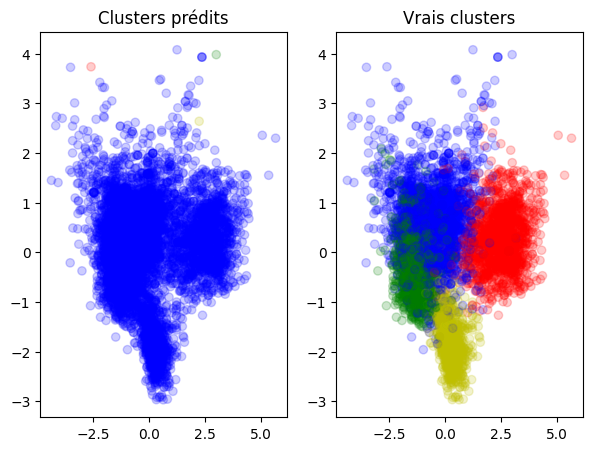

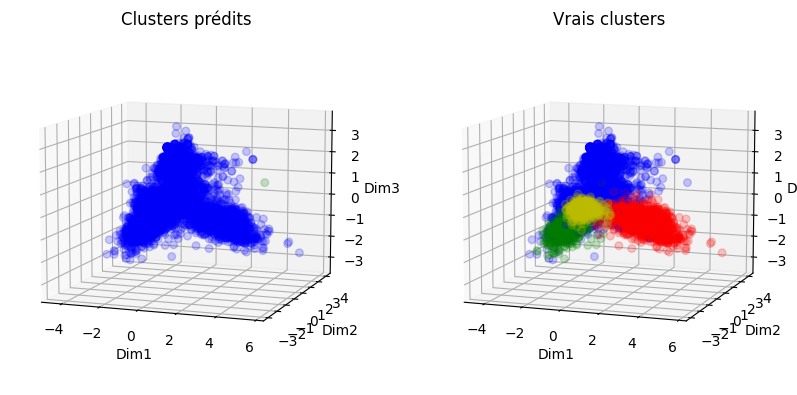

In [31]:
# HAC/CAH avec lien simple
pca_hac_single = AgglomerativeClustering(n_clusters=4, linkage='single') 
pca_hac_single.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_single.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.30316697881839405
Accuracy:  0.3014799154334038
ARI:  0.15680590795492486


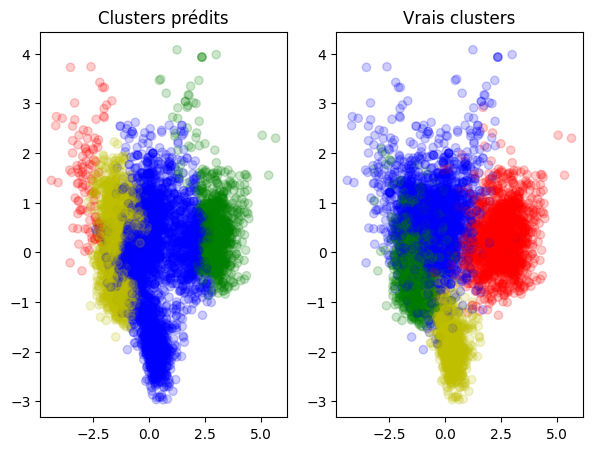

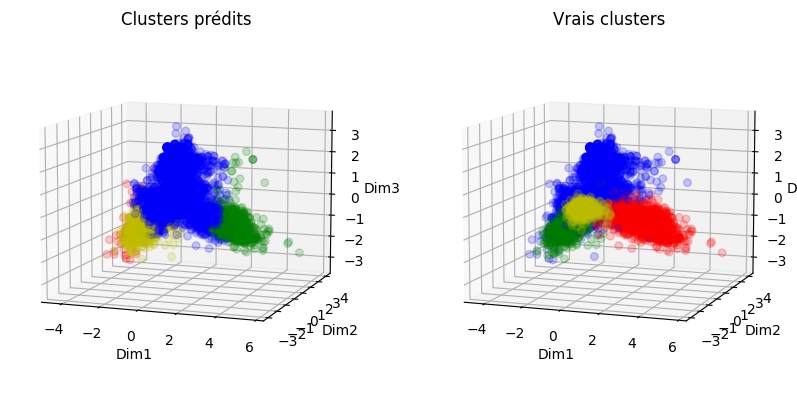

In [32]:
# HAC/CAH avec lien complet
pca_hac_complete = AgglomerativeClustering(n_clusters=4, linkage='complete') 
pca_hac_complete.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_complete.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.444694545893397
Accuracy:  0.2124031007751938
ARI:  0.2832195266354024


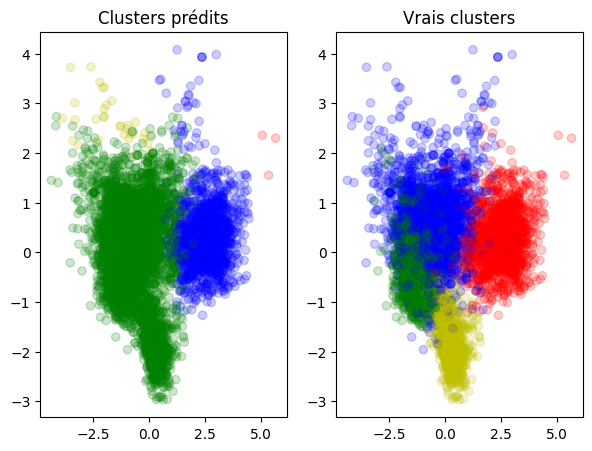

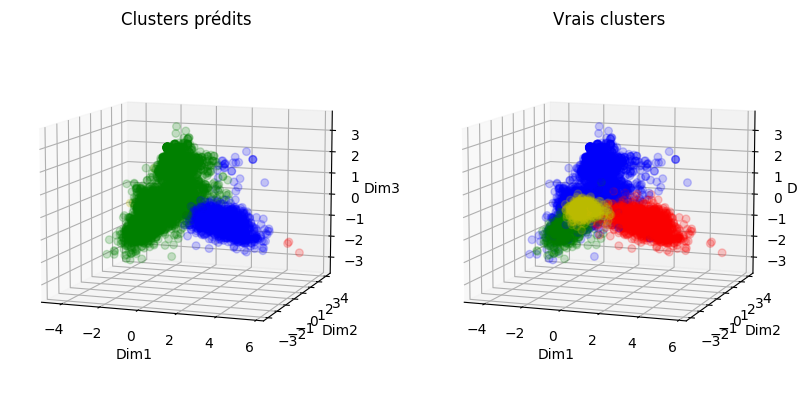

In [33]:
# HAC/CAH avec lien moyen
pca_hac_avg = AgglomerativeClustering(n_clusters=4, linkage='average') 
pca_hac_avg.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_avg.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.6543803450519462
Accuracy:  0.3682875264270613
ARI:  0.4942967990915294


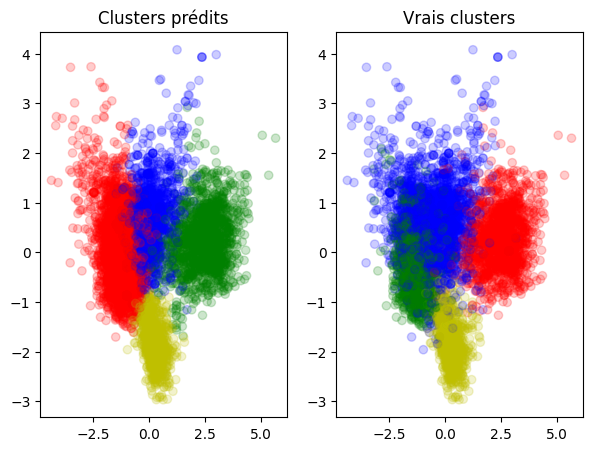

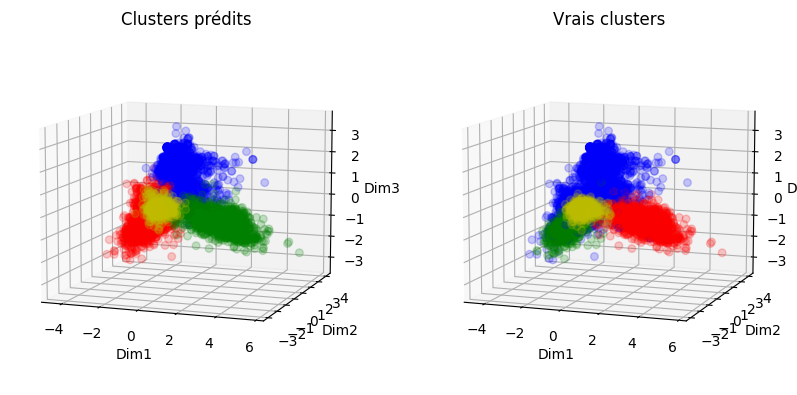

In [34]:
# HAC/CAH avec lien de Ward
pca_hac_ward = AgglomerativeClustering(n_clusters=4, linkage='ward') 
pca_hac_ward.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_ward.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

Visuellement on distingue mieux les clusters dans cet espce réduit mais les différentes métriques ne sont pas meilleures que dans l'espace d'origine. 

### t-SNE

In [35]:
# Réduction de dimension avec t-SNE
tsne = TSNE(n_components=3, init='pca', random_state=7)
tsne_result = tsne.fit_transform(array_w2v)

# Conversion des résultats en dataframe
tsne_columns = ['Dim' + str(c) for c in range(1, tsne_result.shape[1]+1, 1)]
df_tsne = pd.DataFrame(tsne_result, index=X_w2v.index, columns=tsne_columns) 

<Axes: xlabel='Dim1', ylabel='Dim2'>

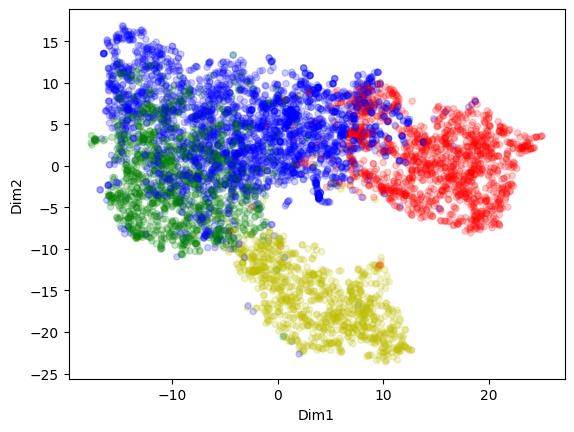

In [36]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_tsne.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

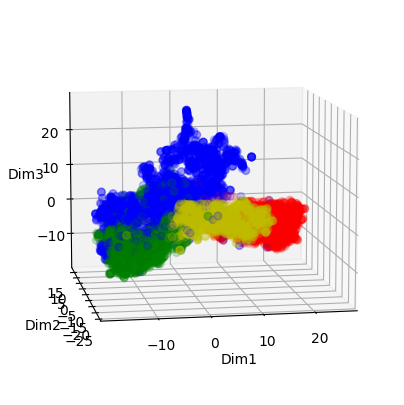

In [37]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_tsne['Dim1'], df_tsne['Dim2'], df_tsne['Dim3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('Dim1')
ax.set_ylabel('Dim2')
ax.set_zlabel('Dim3')
ax.view_init(elev=10, azim=-100)

Les groupes 0 (bleu) et 1 (vert) sont toujours imbriquées. Globalement les groupes sont moins denses et semblent un peu mieux distinguables qu'après l'ACP. La réduction de dimension non-linéaire de t-SNE semble donner des résultats un peu meilleurs.

NMI score:  0.6703675614097717
Accuracy:  0.346723044397463
ARI:  0.5309274318250886


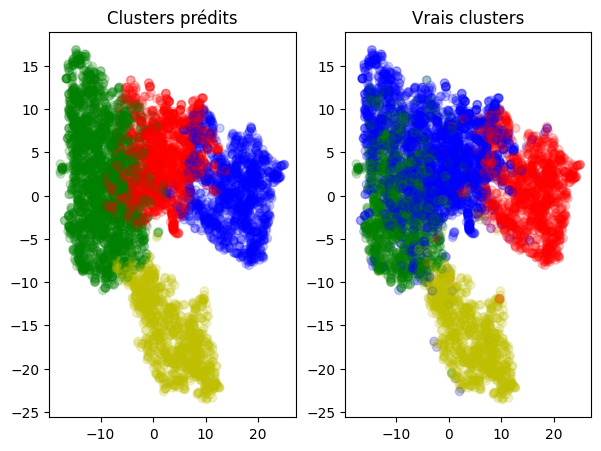

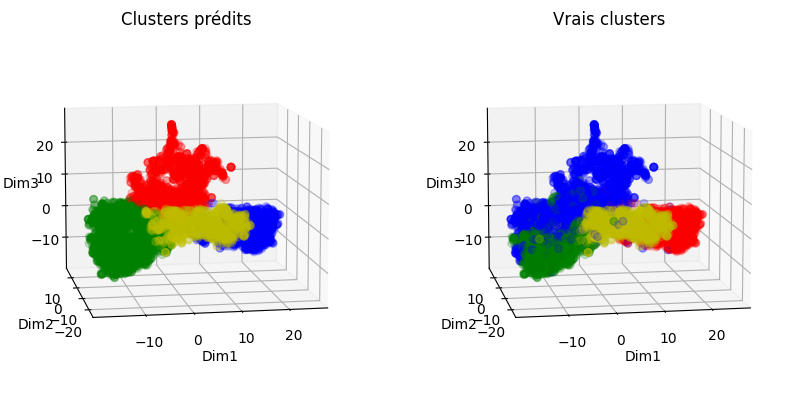

In [38]:
# KMeans++
tsne_kmeans = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=7)
tsne_kmeans.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_kmeans.labels_, elev1=10, azim1=-100, elev2=10, azim2=-100)

NMI score:  0.6687379467398621
Accuracy:  0.45665961945031713
ARI:  0.5286905682624816


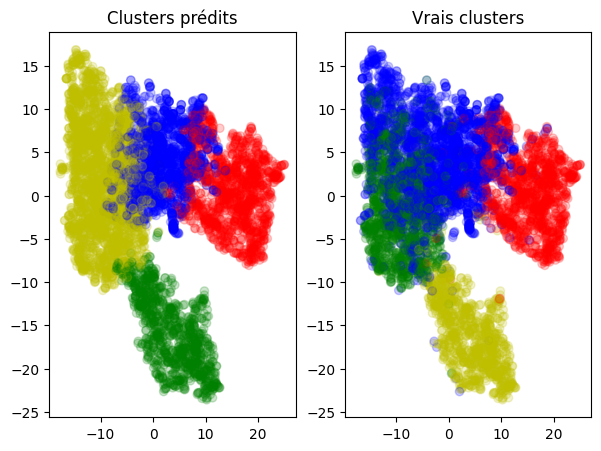

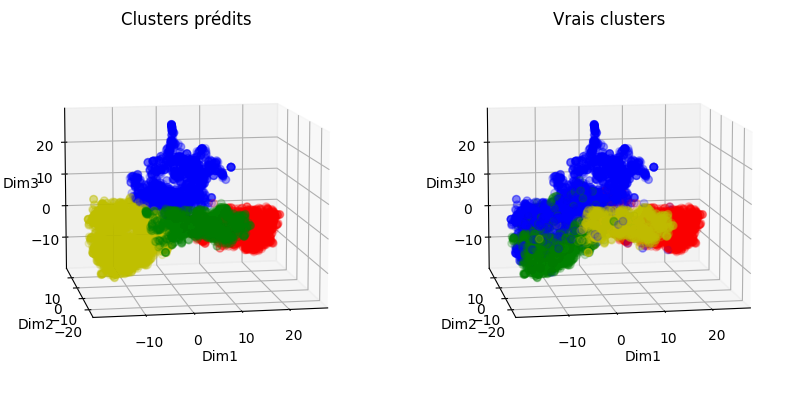

In [39]:
# KMedoids 
tsne_kmedoids = KMedoids(n_clusters=4, random_state=7)
tsne_kmedoids.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_kmedoids.labels_, elev1=10, azim1=-100, elev2=10, azim2=-100)

NMI score:  0.6142545861021763
Accuracy:  0.2661028893587033
ARI:  0.49136210307970574


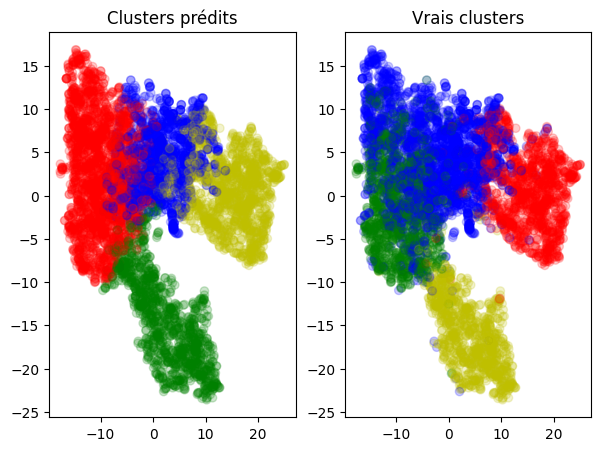

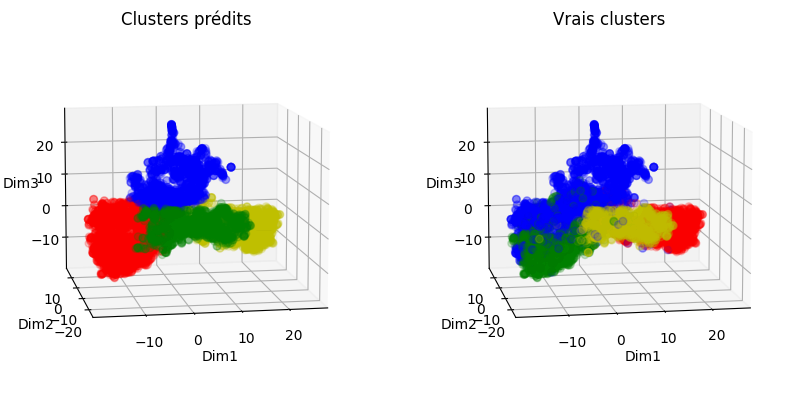

In [40]:
# Spherical KMeans
tsne_skmeans = SphericalKMeans(n_clusters=4, random_state=7)
tsne_skmeans.fit(csr_matrix(tsne_result))

# Evaluation de la qualité du clustering
print_metrics(tsne_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_skmeans.labels_, elev1=10, azim1=-100, elev2=10, azim2=-100)

NMI score:  0.0039023097493080653
Accuracy:  0.449753347427766
ARI:  -0.0010069281264356031


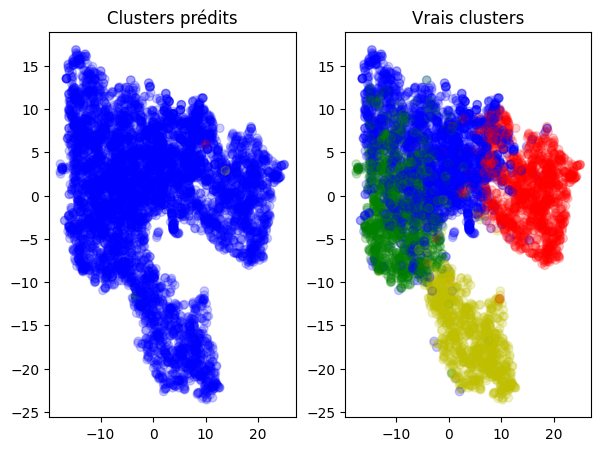

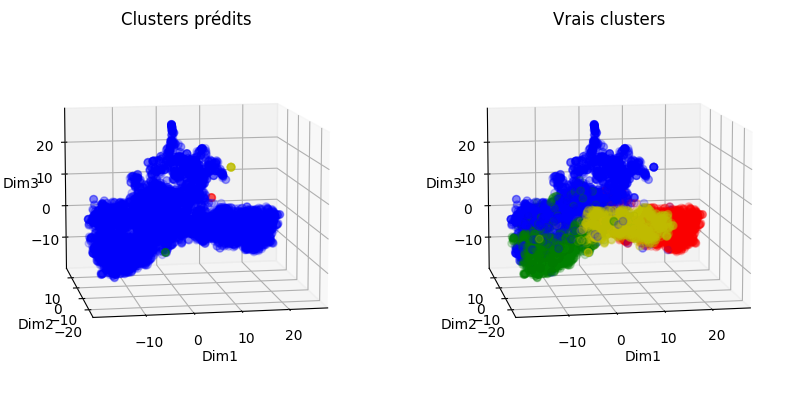

In [41]:
# HAC/CAH avec lien simple
tsne_hac_single = AgglomerativeClustering(n_clusters=4, linkage='single') 
tsne_hac_single.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_single.labels_, elev1=10, azim1=-100, elev2=10, azim2=-100)

NMI score:  0.6504075017690978
Accuracy:  0.4091613812544045
ARI:  0.46438838393138343


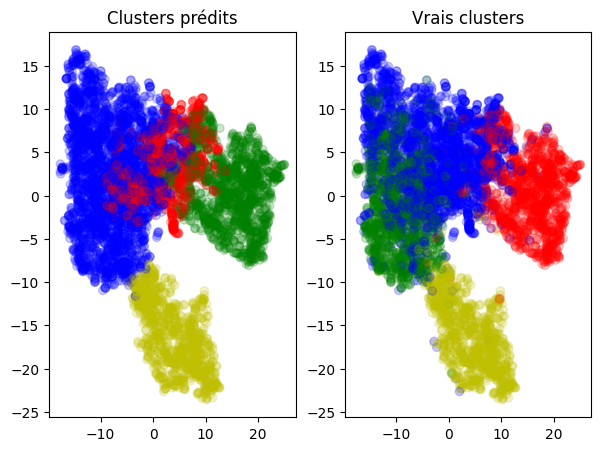

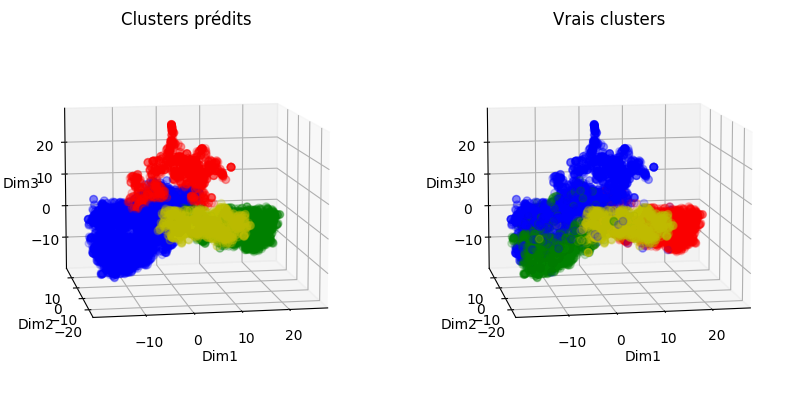

In [42]:
# HAC/CAH avec lien complet
tsne_hac_complete = AgglomerativeClustering(n_clusters=4, linkage='complete') 
tsne_hac_complete.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_complete.labels_, elev1=10, azim1=-100, elev2=10, azim2=-100)

NMI score:  0.664455315608244
Accuracy:  0.8229739252995067
ARI:  0.573784320858904


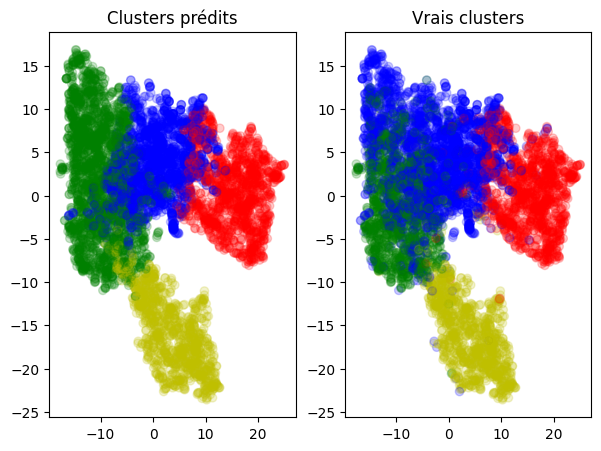

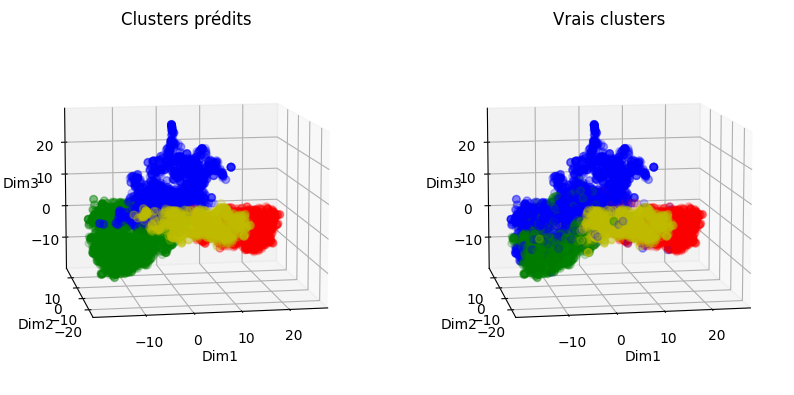

In [43]:
# HAC/CAH avec lien moyen
tsne_hac_avg = AgglomerativeClustering(n_clusters=4, linkage='average') 
tsne_hac_avg.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_avg.labels_, elev1=10, azim1=-100, elev2=10, azim2=-100)

NMI score:  0.6543803450519462
Accuracy:  0.3682875264270613
ARI:  0.4942967990915294


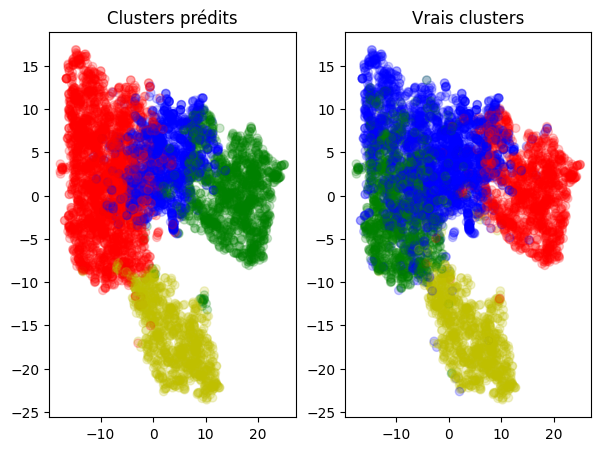

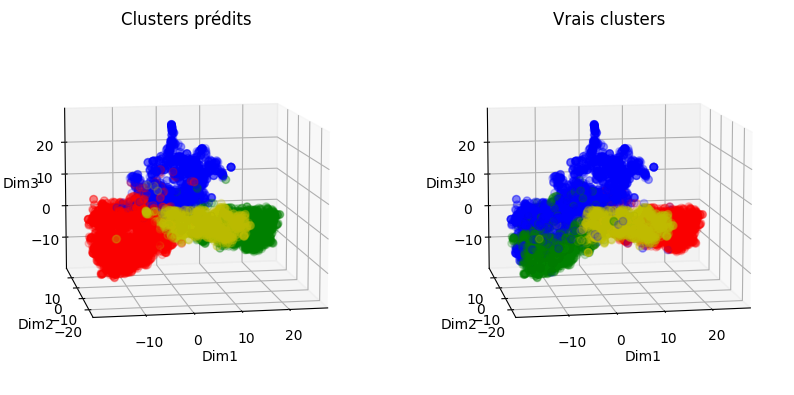

In [44]:
# HAC/CAH avec lien de Ward
tsne_hac_ward = AgglomerativeClustering(n_clusters=4, linkage='ward') 
tsne_hac_ward.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_ward.labels_, elev1=10, azim1=-100, elev2=10, azim2=-100)

Les clusterings sont meilleurs que dans l'espace d'origine et dans le sous-espace de l'ACP.

### UMAP

In [45]:
# Réduction de dimension avec UMAP
umap = UMAP(n_components=3, random_state=7)
umap_result = umap.fit_transform(array_w2v)

# Conversion des résultats en dataframe
umap_columns = ['Dim' + str(c) for c in range(1, umap_result.shape[1]+1, 1)]
df_umap = pd.DataFrame(umap_result, index=X_w2v.index, columns=umap_columns)

<Axes: xlabel='Dim1', ylabel='Dim2'>

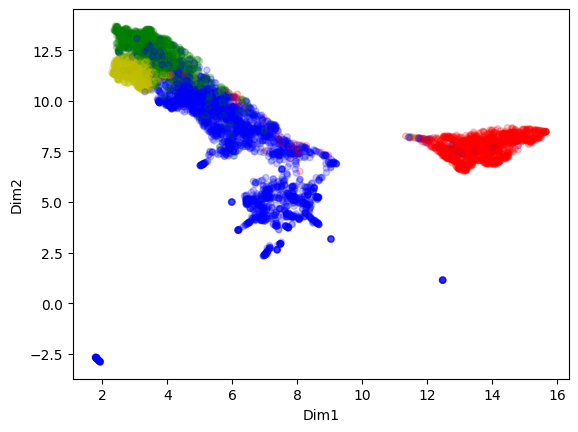

In [46]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_umap.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

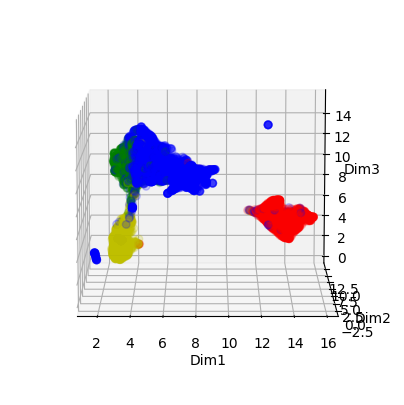

In [84]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_umap['Dim1'], df_umap['Dim2'], df_umap['Dim3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('Dim1')
ax.set_ylabel('Dim2')
ax.set_zlabel('Dim3')
ax.view_init(elev=10, azim=-90)

Le groupe 2 (rouge) est bien séparé mais les autres sont très proches, cela risque de poser problèmes à certaines méthodes.

NMI score:  0.6602530898987155
Accuracy:  0.20648343904157856
ARI:  0.4862577817882919


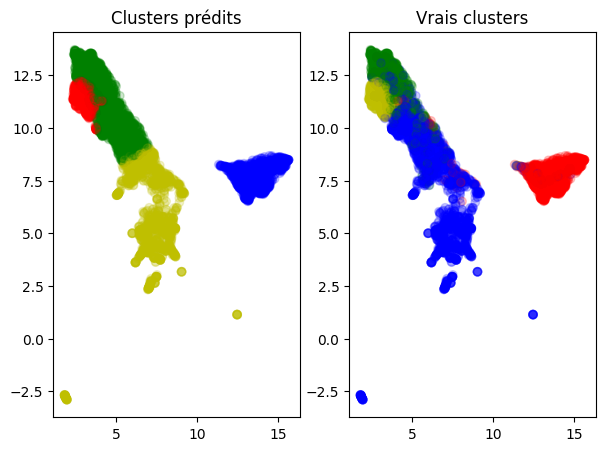

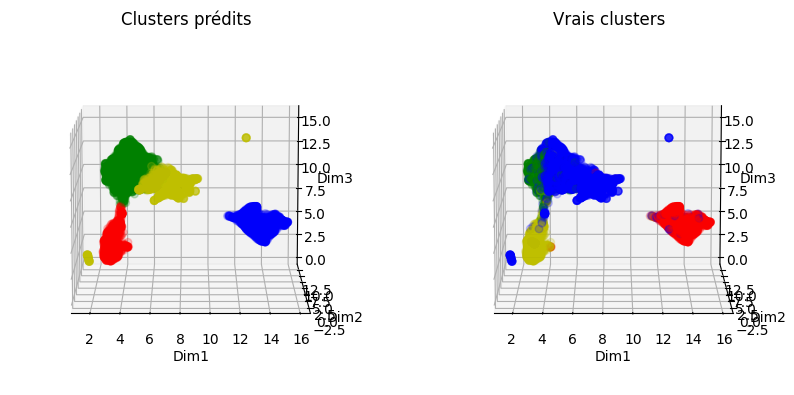

In [85]:
# KMeans++
umap_kmeans = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=7)
umap_kmeans.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_kmeans.labels_, elev1=10, azim1=-90, elev2=10, azim2=-90)

NMI score:  0.6583762832404407
Accuracy:  0.2408738548273432
ARI:  0.4804845448662858


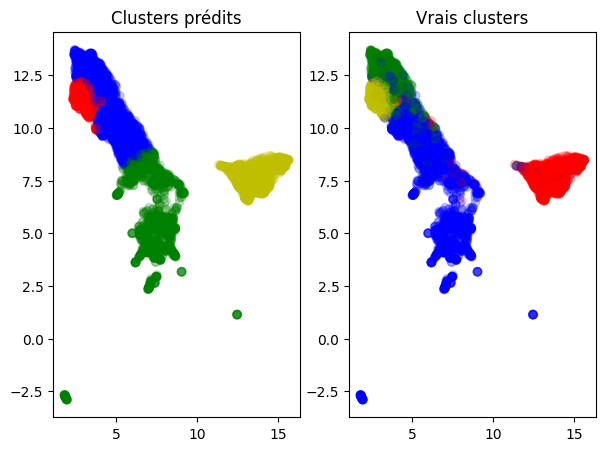

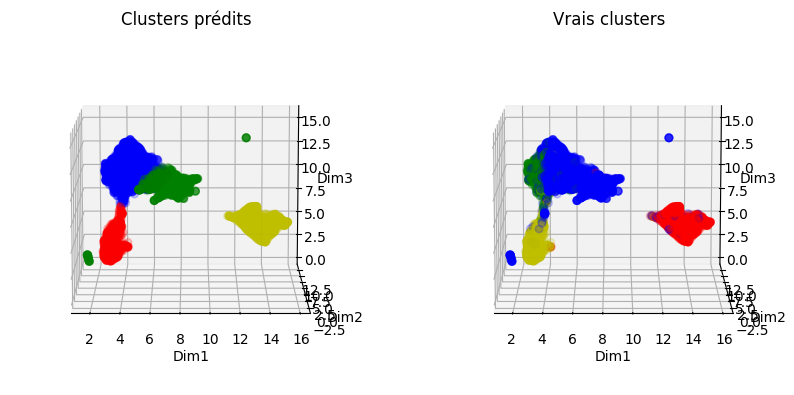

In [86]:
# KMedoids 
umap_kmedoids = KMedoids(n_clusters=4, random_state=7)
umap_kmedoids.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_kmedoids.labels_, elev1=10, azim1=-90, elev2=10, azim2=-90)

NMI score:  0.6197520533746794
Accuracy:  0.258491895701198
ARI:  0.5716985937601462


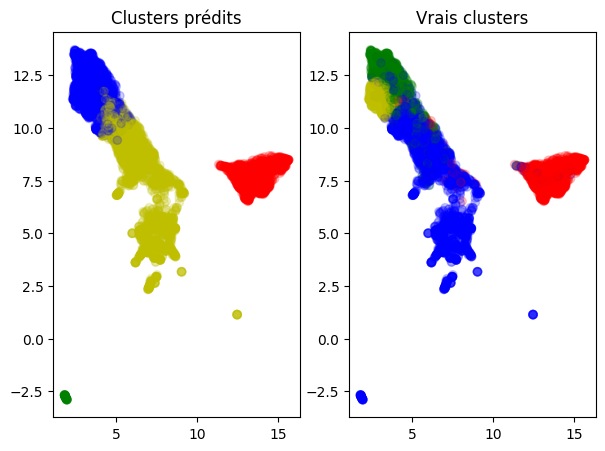

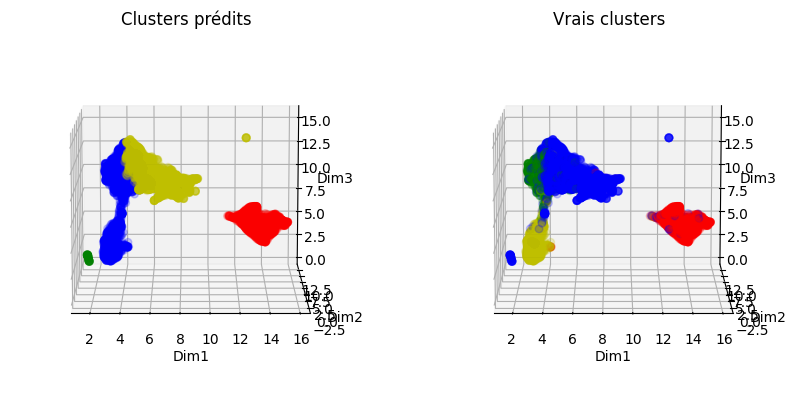

In [87]:
# Spherical KMeans
umap_skmeans = SphericalKMeans(n_clusters=4, random_state=7)
umap_skmeans.fit(csr_matrix(umap_result))

# Evaluation de la qualité du clustering
print_metrics(umap_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_skmeans.labels_, elev1=10, azim1=-90, elev2=10, azim2=-90)

NMI score:  0.4799961559253052
Accuracy:  0.4400281888653982
ARI:  0.3053463317343486


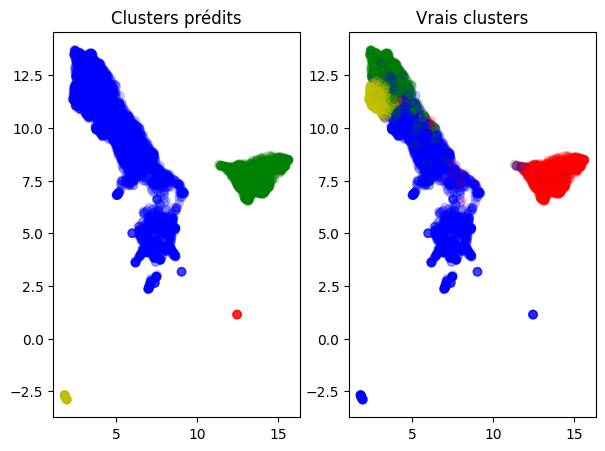

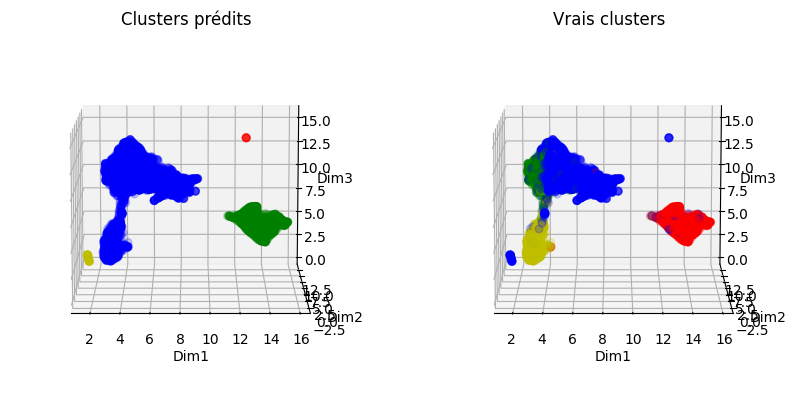

In [88]:
# HAC/CAH avec lien simple
umap_hac_single = AgglomerativeClustering(n_clusters=4, linkage='single') 
umap_hac_single.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_single.labels_, elev1=10, azim1=-90, elev2=10, azim2=-90)

NMI score:  0.48658276111890636
Accuracy:  0.3000704721634954
ARI:  0.24341287985120677


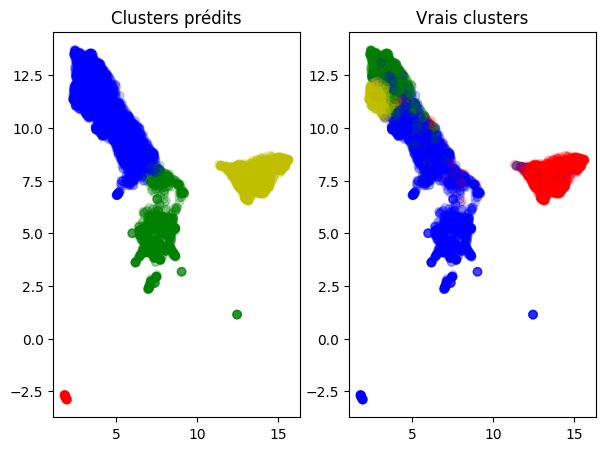

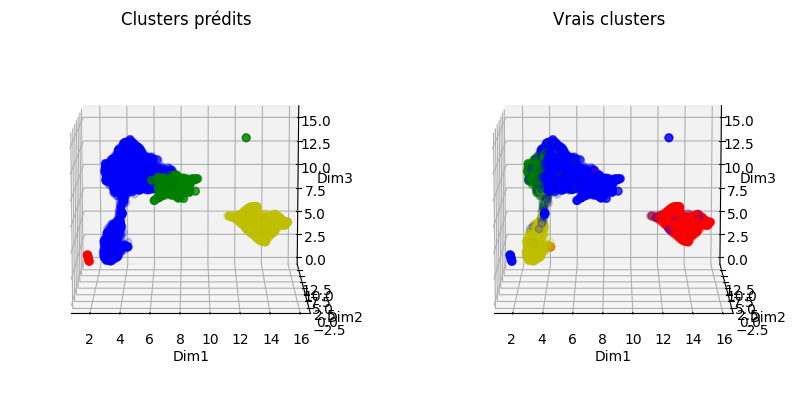

In [89]:
# HAC/CAH avec lien complet
umap_hac_complete = AgglomerativeClustering(n_clusters=4, linkage='complete') 
umap_hac_complete.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_complete.labels_, elev1=10, azim1=-90, elev2=10, azim2=-90)

NMI score:  0.4799961559253052
Accuracy:  0.4400281888653982
ARI:  0.3053463317343486


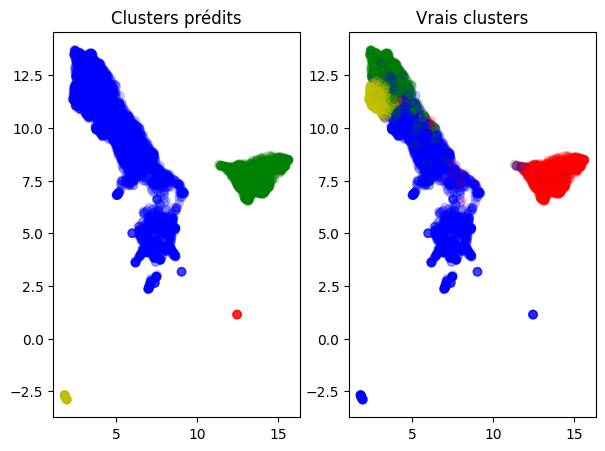

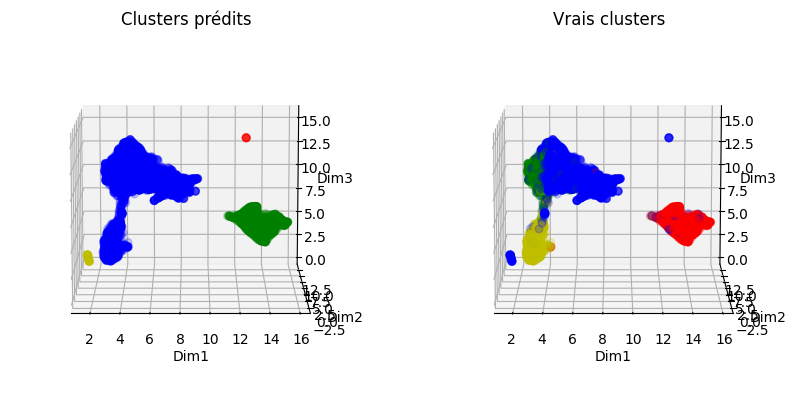

In [90]:
# HAC/CAH avec lien moyen
umap_hac_avg = AgglomerativeClustering(n_clusters=4, linkage='average') 
umap_hac_avg.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_avg.labels_, elev1=10, azim1=-90, elev2=10, azim2=-90)

NMI score:  0.648627662237317
Accuracy:  0.3223396758280479
ARI:  0.46607609060768357


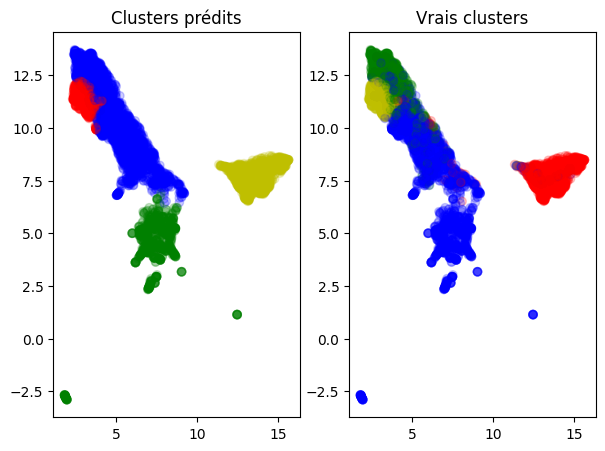

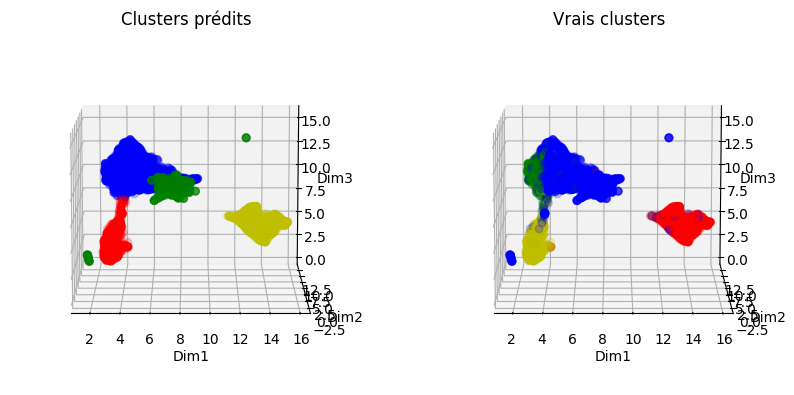

In [91]:
# HAC/CAH avec lien de Ward
umap_hac_ward = AgglomerativeClustering(n_clusters=4, linkage='ward') 
umap_hac_ward.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_ward.labels_, elev1=10, azim1=-90, elev2=10, azim2=-90)

Comme suspecté, les résultats sont moins bons qu'après t-SNE.

### Autoencoders

In [56]:
# Réduction de dimension avec Autoencoders
ae_result = autoencoder(array_w2v.astype("float32"), embedding_dim=3, seed=7)

# Conversion des résultats en dataframe
ae_columns = ['Dim' + str(c) for c in range(1, ae_result.shape[1]+1, 1)]
df_ae = pd.DataFrame(ae_result, index=X_w2v.index, columns=ae_columns)

100%|██████████| 50/50 [00:09<00:00,  5.36it/s]


<Axes: xlabel='Dim1', ylabel='Dim2'>

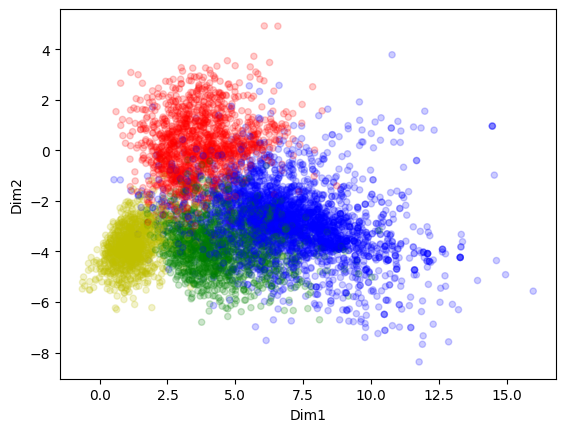

In [57]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_ae.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

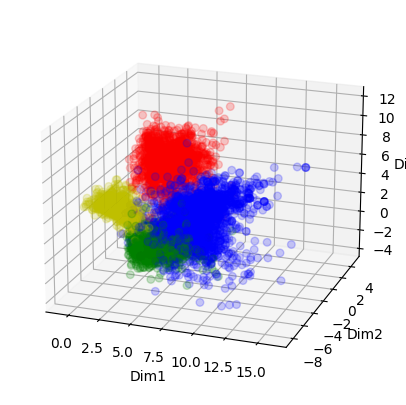

In [58]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_ae['Dim1'], df_ae['Dim2'], df_ae['Dim3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('Dim1')
ax.set_ylabel('Dim2')
ax.set_zlabel('Dim3')
ax.view_init(elev=20, azim=-70)

Là encore les groupes 0 (bleu) et 1 (vert) sont imbriqués. Tous les clusters sont proches. Les Autoencoders ne semblent pas faire mieux. Les méthodes recherchant des clusters sphériques vont probablement mieux fonctionner.

NMI score:  0.6289024205244848
Accuracy:  0.21085271317829457
ARI:  0.45865840567589095


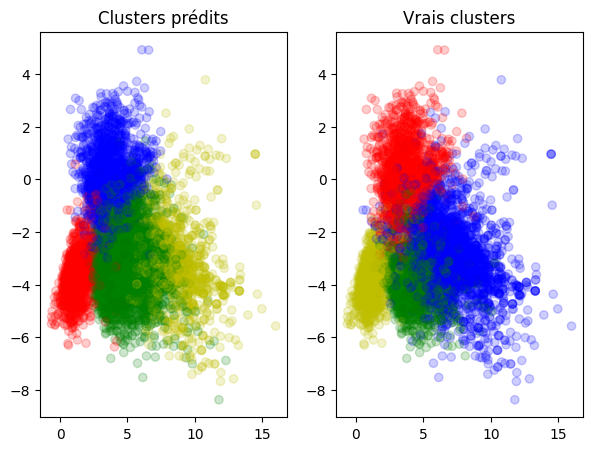

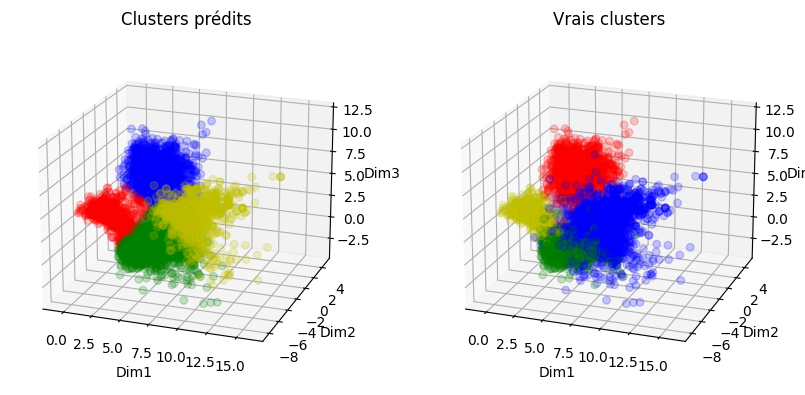

In [59]:
# KMeans++
ae_kmeans = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=7)
ae_kmeans.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_kmeans.labels_, elev1=20, azim1=-70, elev2=20, azim2=-70)

NMI score:  0.6346795751500671
Accuracy:  0.01324876673713883
ARI:  0.46108463165643404


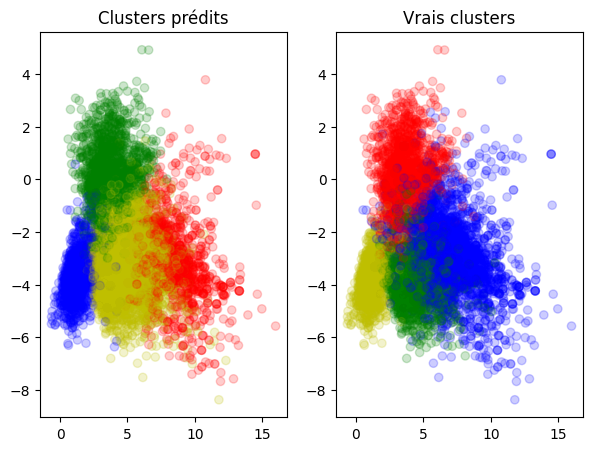

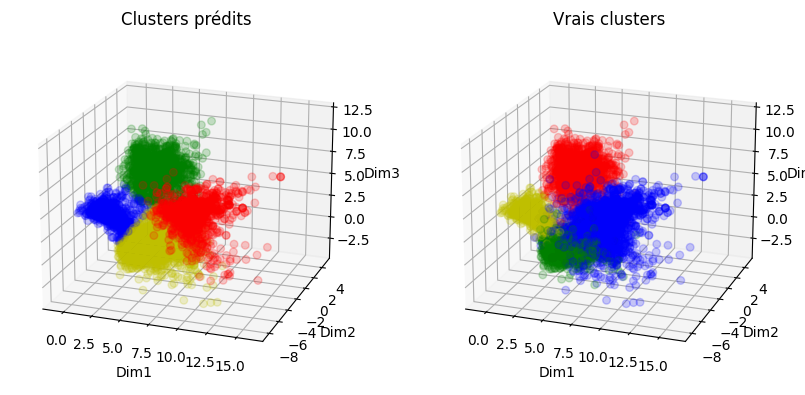

In [60]:
# KMedoids 
ae_kmedoids = KMedoids(n_clusters=4, random_state=7)
ae_kmedoids.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_kmedoids.labels_, elev1=20, azim1=-70, elev2=20, azim2=-70)

NMI score:  0.6569712421437217
Accuracy:  0.5312191684284707
ARI:  0.4974625053049019


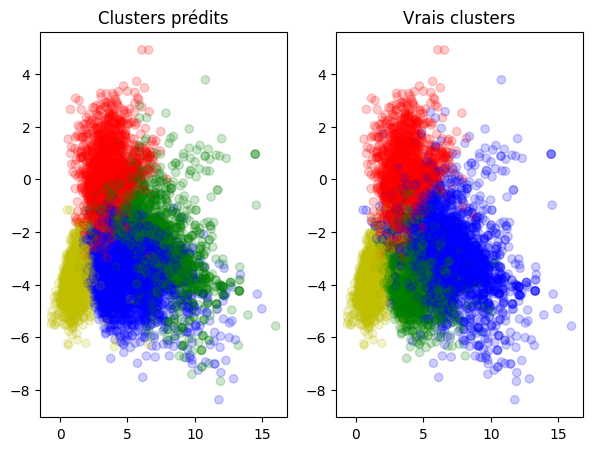

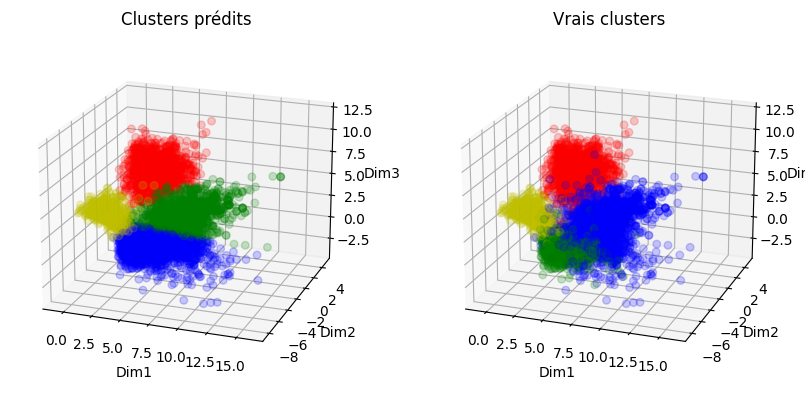

In [61]:
# Spherical KMeans
ae_skmeans = SphericalKMeans(n_clusters=4, random_state=7)
ae_skmeans.fit(csr_matrix(ae_result))

# Evaluation de la qualité du clustering
print_metrics(ae_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_skmeans.labels_, elev1=20, azim1=-70, elev2=20, azim2=-70)

NMI score:  0.0012215509254033328
Accuracy:  0.4510218463706836
ARI:  -0.0005009671977529044


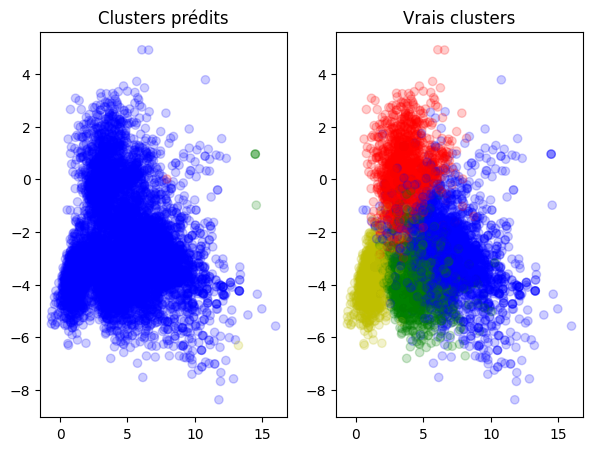

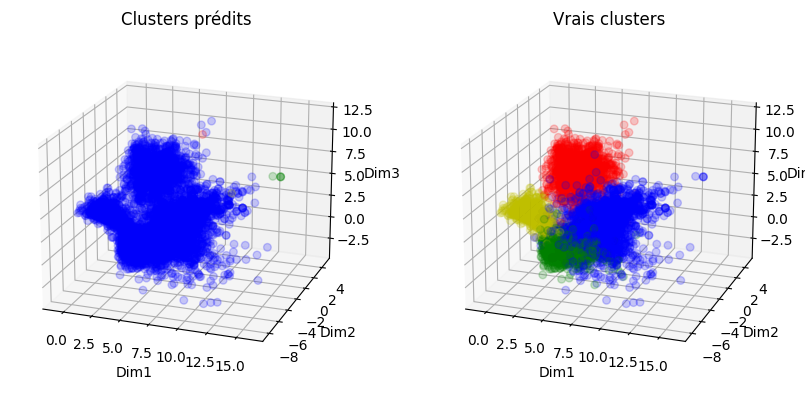

In [62]:
# HAC/CAH avec lien simple
ae_hac_single = AgglomerativeClustering(n_clusters=4, linkage='single') 
ae_hac_single.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_single.labels_, elev1=20, azim1=-70, elev2=20, azim2=-70)

NMI score:  0.35092626556164164
Accuracy:  0.061028893587033124
ARI:  0.17318458331108913


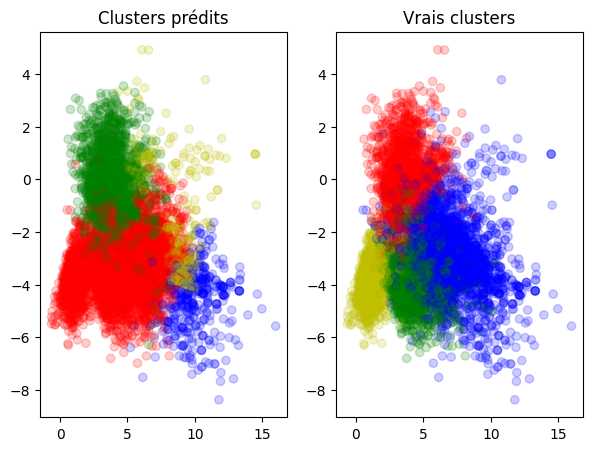

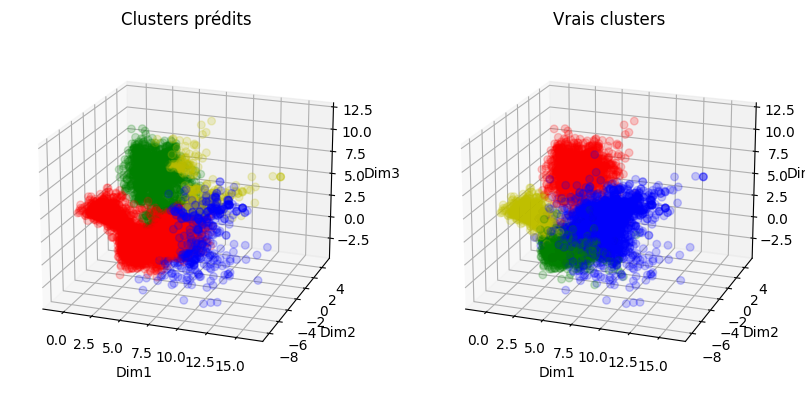

In [63]:
# HAC/CAH avec lien complet
ae_hac_complete = AgglomerativeClustering(n_clusters=4, linkage='complete') 
ae_hac_complete.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_complete.labels_, elev1=20, azim1=-70, elev2=20, azim2=-70)

NMI score:  0.00481542782911224
Accuracy:  0.19915433403805496
ARI:  -0.0023112283720088697


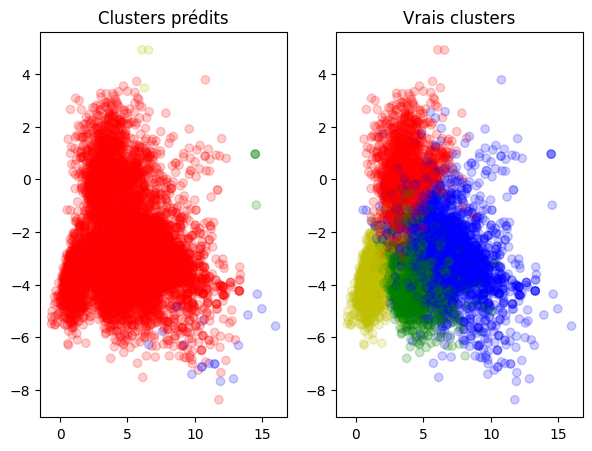

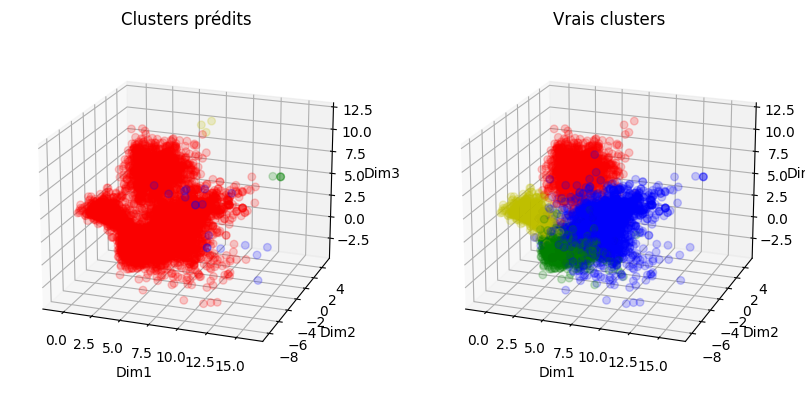

In [64]:
# HAC/CAH avec lien moyen
ae_hac_avg = AgglomerativeClustering(n_clusters=4, linkage='average') 
ae_hac_avg.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_avg.labels_, elev1=20, azim1=-70, elev2=20, azim2=-70)

NMI score:  0.6525636108923906
Accuracy:  0.37688513037350246
ARI:  0.46616028131899107


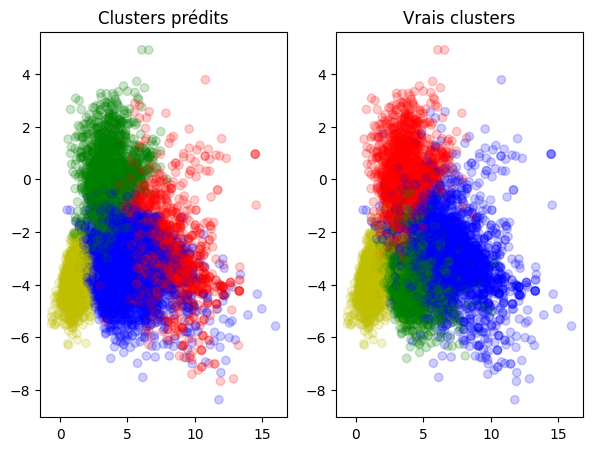

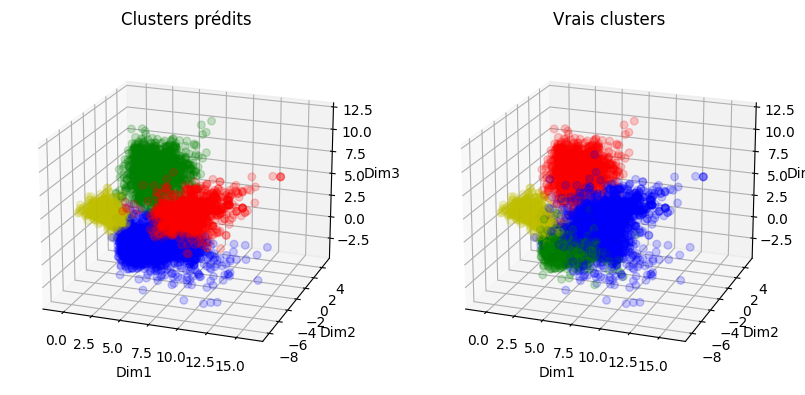

In [65]:
# HAC/CAH avec lien de Ward
ae_hac_ward = AgglomerativeClustering(n_clusters=4, linkage='ward') 
ae_hac_ward.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_ward.labels_, elev1=20, azim1=-70, elev2=20, azim2=-70)

Comme prévu, les méthodes recherchant des clusters de forme sphérique performent mieux. Toutefois ces résultats sont en dessous de ceux obtenus par certaines méthodes après t-SNE.

## Estimation du nombre de groupes avec NbClust

Estimation du nombre de classes avec le package R NbClust (avec un critère de distance euclidienne car nous comparons des lignes) 

Lien minimum (single): trouve clusters de formes allongées ou irrégulières mais sensible à l’effet de chaîne.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 8 proposed 2 as the best number of clusters 
* 3 proposed 3 as the best number of clusters 
* 3 proposed 5 as the best number of clusters 
* 2 proposed 6 as the best number of clusters 
* 2 proposed 7 as the best number 

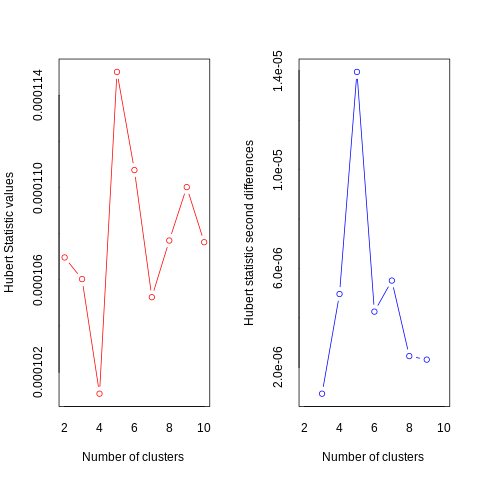

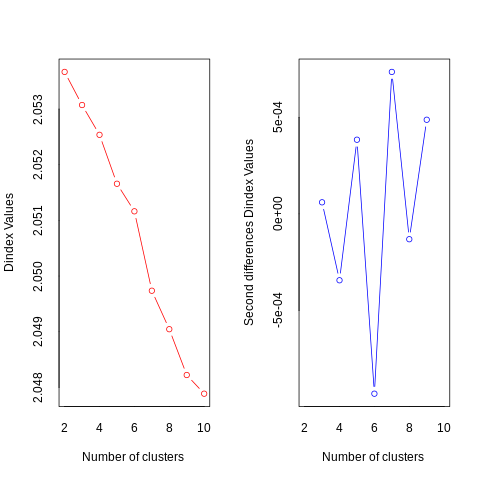

In [ ]:
%%R -i array_w2v
res <- NbClust(array_w2v, distance="euclidean", min.nc=2, max.nc=10,
               method="single", index="all")

Lien maximum (complete): fusionne les deux groupes qui ont la plus petite distance maximale entre leurs points.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 11 proposed 2 as the best number of clusters 
* 1 proposed 3 as the best number of clusters 
* 4 proposed 5 as the best number of clusters 
* 5 proposed 9 as the best number of clusters 

                   ***** Conclus

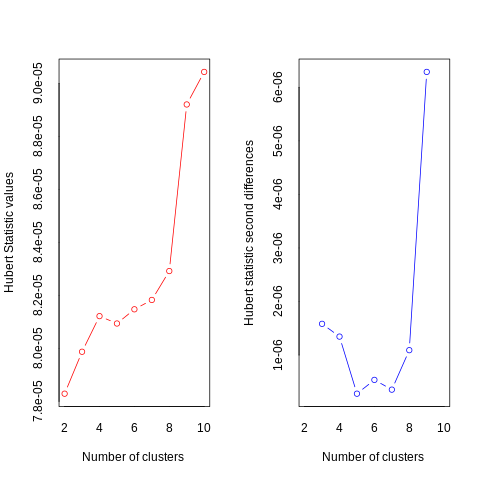

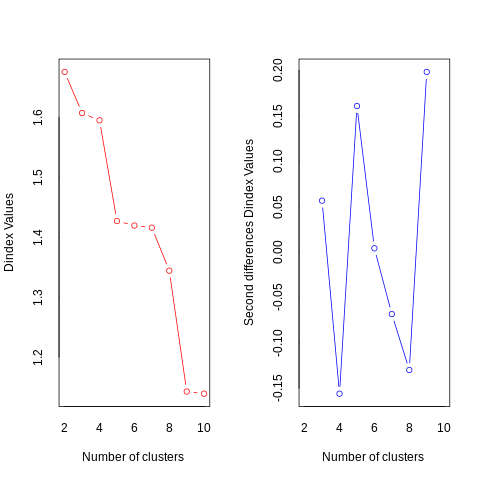

In [ ]:
%%R
res <- NbClust(array_w2v, distance = "euclidean", min.nc=2, max.nc=10,
             method = "complete", index = "all")

Lien moyen (average): fusionne les deux groupes qui ont la plus petite distance moyenne entre tous leurs points.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 10 proposed 2 as the best number of clusters 
* 1 proposed 3 as the best number of clusters 
* 2 proposed 5 as the best number of clusters 
* 9 proposed 6 as the best number of clusters 
* 1 proposed 8 as the best number

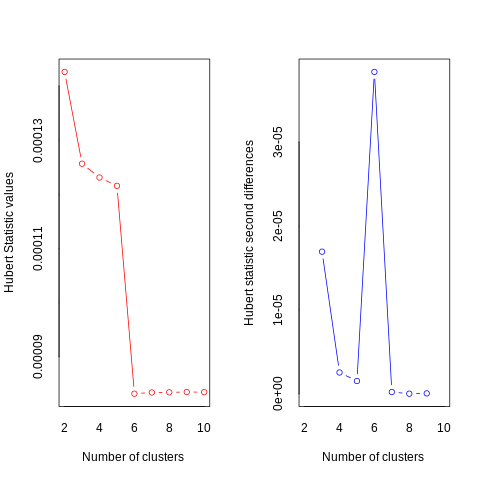

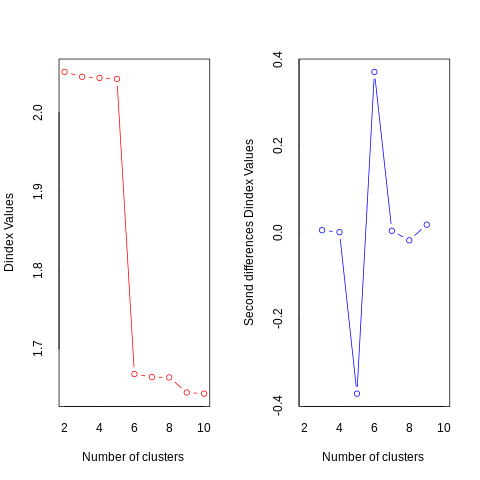

In [ ]:
%%R
res <- NbClust(array_w2v, distance = "euclidean", min.nc=2, max.nc=10,
             method = "average", index = "all")

Lien de Ward: choisit les deux groupes à fusionner de manière à ce que la variance au sein de tous les groupes augmente le moins possible. Cela permet souvent d'obtenir des groupes de taille relativement égale. Trouve des clusters de forme sphérique.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 5 proposed 2 as the best number of clusters 
* 4 proposed 3 as the best number of clusters 
* 9 proposed 4 as the best number of clusters 
* 1 proposed 5 as the best number of clusters 
* 1 proposed 8 as the best number 

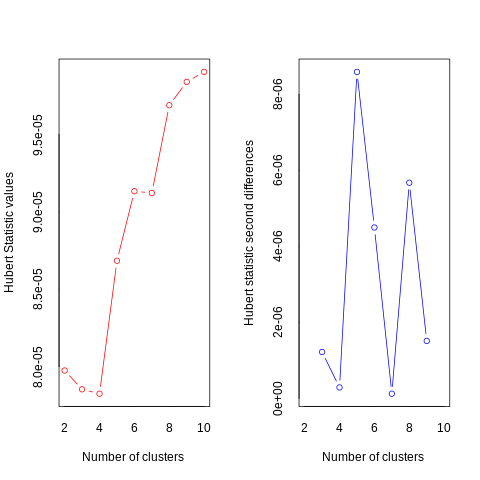

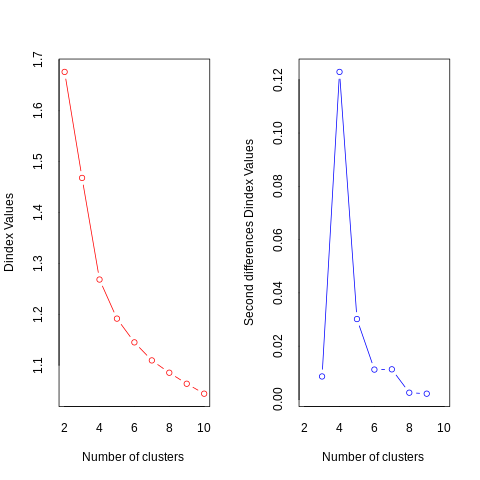

In [ ]:
%%R
res <- NbClust(array_w2v, distance = "euclidean", min.nc=2, max.nc=10,
             method = "ward.D", index = "all")

Le nombre de clusters trouvé majoritairement par les différents critères est de 2, sauf le critère de Ward qui trouve 4 clusters.


## Synthèse

In [66]:
# Récupération des résultats des clusterings
preds = [kmeans.labels_, 
         kmedoids.labels_,
         skmeans.labels_,
         hac_single.labels_,
         hac_complete.labels_,
         hac_avg.labels_,
         hac_ward.labels_,
         pca_kmeans.labels_,
         pca_kmedoids.labels_,
         pca_skmeans.labels_,
         pca_hac_single.labels_,
         pca_hac_complete.labels_,
         pca_hac_avg.labels_,
         pca_hac_ward.labels_,
         tsne_kmeans.labels_,
         tsne_kmedoids.labels_,
         tsne_skmeans.labels_,
         tsne_hac_single.labels_,
         tsne_hac_complete.labels_,
         tsne_hac_avg.labels_,
         tsne_hac_ward.labels_,
         umap_kmeans.labels_,
         umap_kmedoids.labels_,
         umap_skmeans.labels_,
         umap_hac_single.labels_,
         umap_hac_complete.labels_,
         umap_hac_avg.labels_,
         umap_hac_ward.labels_,
         ae_kmeans.labels_,
         ae_kmedoids.labels_,
         ae_skmeans.labels_,
         ae_hac_single.labels_,
         ae_hac_complete.labels_,
         ae_hac_avg.labels_,
         ae_hac_ward.labels_]

# Récupération des scores
nmi_scores = [normalized_mutual_info_score(y_pred, y) for y_pred in preds]
accuracy_scores = [accuracy_score(y_pred, y) for y_pred in preds]
ari_scores = [adjusted_rand_score(y_pred, y) for y_pred in preds]

# Nom des méthodes
methods = ["Kmeans++", 
           "Kmedoids", 
           "Spherical Kmeans", 
           "CAH (simple)", 
           "CAH (complet)",
           "CAH (moyen)", 
           "CAH (Ward)",
           "PCA + Kmeans++", 
           "PCA + Kmedoids", 
           "PCA + Spherical Kmeans", 
           "PCA + CAH (simple)", 
           "PCA + CAH (complet)", 
           "PCA + CAH (moyen)", 
           "PCA + CAH (Ward)",
           "t-SNE + Kmeans++",
           "t-SNE + Kmedoids",
           "t-SNE + Spherical Kmeans",
           "t-SNE + CAH (simple)", 
           "t-SNE + CAH (complet)",
           "t-SNE + CAH (moyen)",
           "t-SNE + CAH (Ward)",
           "UMAP + Kmeans++",
           "UMAP + Kmedoids",
           "UMAP + Spherical Kmeans",
           "UMAP + CAH (simple)",
           "UMAP + CAH (complet)",
           "UMAP + CAH (moyen)",
           "UMAP + CAH (Ward)",
           "AE + Kmeans++",
           "AE + Kmedoids",
           "AE + Spherical Kmeans",
           "AE + CAH (simple)",
           "AE + CAH (complet)",
           "AE + CAH (moyen)",
           "AE + CAH (Ward)"]

# Création d'un dataframe
tab = pd.concat([pd.Series(nmi_scores, name="NMI", index=methods),
                 pd.Series(accuracy_scores, name="Accuracy", index=methods),
                 pd.Series(ari_scores, name="ARI", index=methods)],
                axis=1)

# Calcul de la moyenne des scores NMI et ARI
tab["NMI-ARI mean"] = tab[["NMI","ARI"]].mean(axis=1)
tab

,NMI,Accuracy,ARI,NMI-ARI mean
Kmeans++,0.621739,0.203665,0.466656,0.544198
Kmedoids,0.637702,0.017054,0.476663,0.557183
Spherical Kmeans,0.518041,0.591684,0.410377,0.464209
CAH (simple),0.000522,0.451163,-0.000354,0.000084
CAH (complet),0.445217,0.349824,0.303109,0.374163
CAH (moyen),0.446424,0.427061,0.285359,0.365892
CAH (Ward),0.641212,0.394080,0.470318,0.555765
PCA + Kmeans++,0.618098,0.014799,0.464377,0.541237
PCA + Kmedoids,0.629801,0.235095,0.469223,0.549512
PCA + Spherical Kmeans,0.597142,0.222974,0.452009,0.524575


Le problème de l'utilisation de la précision est qu'elle exige que les étiquettes de clusters attribuées correspondent exactement à la vérité terrain. Cependant, les étiquettes des clusters ne sont pas significatives en elles-mêmes. La seule chose qui compte est de savoir quels points se trouvent dans le même cluster. 

Il vaut mieux se référer au NMI et ARI. En outre ces métriques donnent un score entre O et 1, 1 étant le maximum. Il est donc possible de calculer la moyenne de ces deux scores pour trouver la combinaison qui donne les meilleurs résultats globaux. 

In [67]:
# Meilleure combinaison
tab[tab["NMI-ARI mean"]==tab["NMI-ARI mean"].max()]

,NMI,Accuracy,ARI,NMI-ARI mean
t-SNE + CAH (moyen),0.664455,0.822974,0.573784,0.61912


En combinant toutes les métriques la méthode alliant UMAP et CAH avec le critère de Ward obtient les meilleurs résultats. Globalement les réductions de dimension obtiennent des résultats un peu meilleurs que dans l'espace d'origine.

# Partie 2 : Approche jointe/simultanée

## Reduced KMeans

In [68]:
%%R -i array_w2v
# Approche simultanée ACP avec KMeans
rkm_result = cluspca(array_w2v, nclus=4, ndim=3, nstart=10, seed=7)

  |======================================================================| 100%

NMI score:  0.6367932777350777
Accuracy:  0.5619450317124736
ARI:  0.47408308665970755


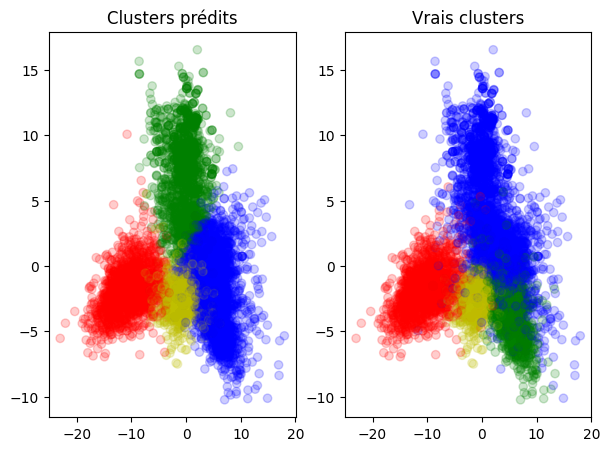

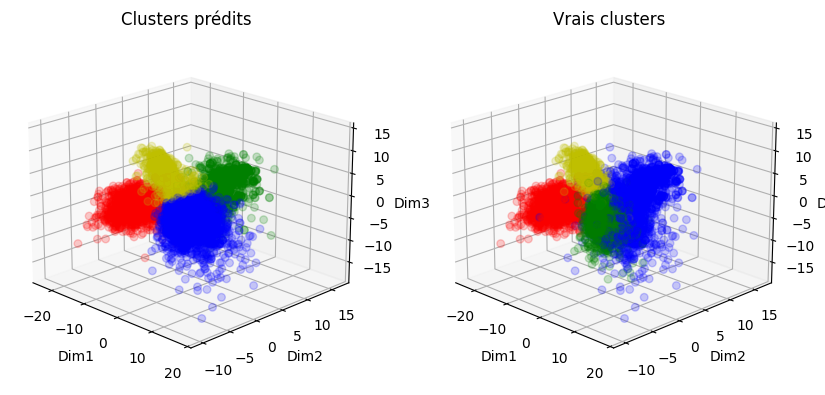

In [76]:
# Récupération des objet R contenant les résultats
rkm_labels = np.array(robjects.r('rkm_result$cluster'))
rkm_result = np.array(robjects.r('rkm_result$obscoord'))

# Soustraction pour faire correspondre les valeurs issues de R à celles de python
rkm_labels = rkm_labels - 1

# Evaluation de la qualité du clustering
print_metrics(rkm_labels, y)

# Comparaison des clusters en 2D 
clust_viz_2D(rkm_result, rkm_labels)

# Comparaison des clusters en 3D
clust_viz_3D(rkm_result, rkm_labels, elev1=20, azim1=-45, elev2=20, azim2=-45)

RKM trouve un espace proche de celui des Autoencoders. Les clusters sont également de forme sphérique. Les clusters sont meilleurs que ceux trouvés par la plupart des différentes combinaison testées.

## Deep KMeans

In [71]:
# Approche simultanée avec Deep KMeans
dkm_result, dkm_result_labels = DKM(array_w2v, n_clusters=4, n_components=3)

<ipython-input-70-b8ce86626ea5>:15: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input,


Starting autoencoder pretraining...


100%|██████████| 50/50 [01:28<00:00,  1.78s/it]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [03:12<00:00,  9.63s/it]


NMI score:  0.6337102382367634
Accuracy:  0.24383368569415081
ARI:  0.4663417445251939


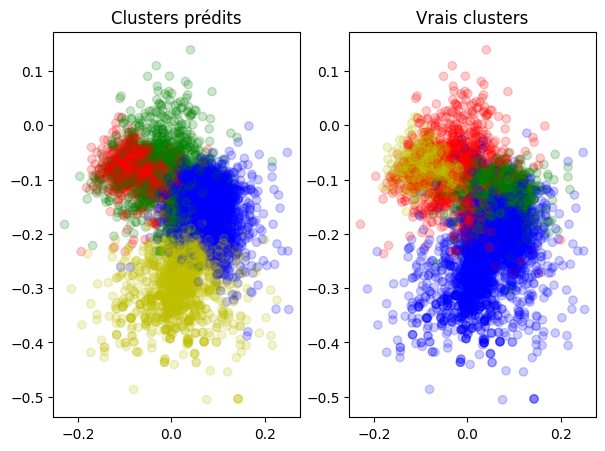

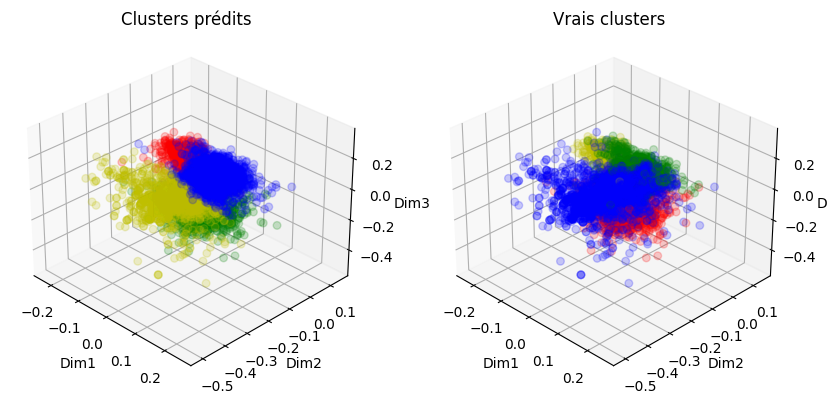

In [78]:
# Evaluation de la qualité du clustering
print_metrics(dkm_result_labels, y)

# Comparaison des clusters en 2D 
clust_viz_2D(dkm_result, dkm_result_labels)

# Comparaison des clusters en 3D
clust_viz_3D(dkm_result, dkm_result_labels, elev1=30, azim1=-45, elev2=30, azim2=-45)

Les clusters sont moins bons qu'avec RKM.

# Conclusion

In [73]:
# Ajout des résultats des approches simultanées au tableau récapitulatif
tab_all = tab.reset_index()

new_rows = [{'index': 'RKM', 
             'NMI': normalized_mutual_info_score(rkm_labels, y),
             'Accuracy': accuracy_score(rkm_labels, y),
             'ARI': adjusted_rand_score(rkm_labels, y),
             'NMI-ARI mean': np.mean([normalized_mutual_info_score(rkm_labels, y),
                                      adjusted_rand_score(rkm_labels, y)])},
            {'index': 'DKM', 
             'NMI': normalized_mutual_info_score(dkm_result_labels, y),
             'Accuracy': accuracy_score(dkm_result_labels, y),
             'ARI': adjusted_rand_score(dkm_result_labels, y),
             'NMI-ARI mean': np.mean([normalized_mutual_info_score(dkm_result_labels, y),
                                      adjusted_rand_score(dkm_result_labels, y)])}]

tab_all = tab_all.append(new_rows, ignore_index=True).set_index('index')

# Affichage du tableau de synthèse des résultats
tab_all

<ipython-input-73-1b0d9a5b26f2>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tab_all = tab_all.append(new_rows, ignore_index=True).set_index('index')


,NMI,Accuracy,ARI,NMI-ARI mean
index,,,,
Kmeans++,0.621739,0.203665,0.466656,0.544198
Kmedoids,0.637702,0.017054,0.476663,0.557183
Spherical Kmeans,0.518041,0.591684,0.410377,0.464209
CAH (simple),0.000522,0.451163,-0.000354,0.000084
CAH (complet),0.445217,0.349824,0.303109,0.374163
CAH (moyen),0.446424,0.427061,0.285359,0.365892
CAH (Ward),0.641212,0.394080,0.470318,0.555765
PCA + Kmeans++,0.618098,0.014799,0.464377,0.541237
PCA + Kmedoids,0.629801,0.235095,0.469223,0.549512


In [74]:
# Meilleure combinaison
tab_all[tab_all["NMI-ARI mean"]==tab_all["NMI-ARI mean"].max()]

,NMI,Accuracy,ARI,NMI-ARI mean
index,,,,
t-SNE + CAH (moyen),0.664455,0.822974,0.573784,0.61912


Affichage du meilleur clustering

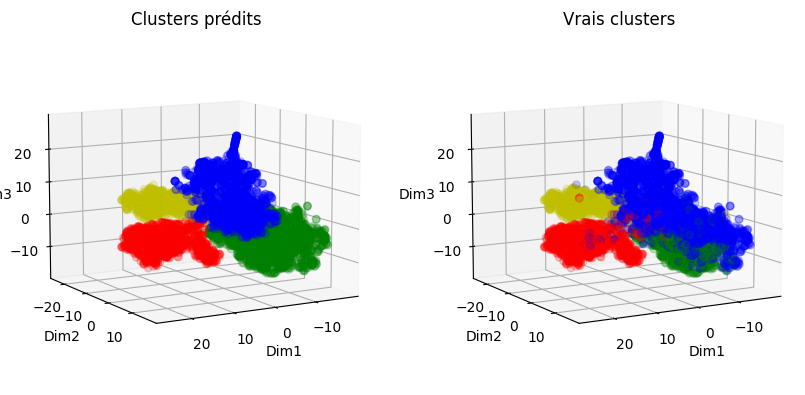

In [83]:
# Affichage du meilleur clustering en 3D
clust_viz_3D(tsne_result, tsne_hac_avg.labels_, elev1=10, azim1=60, elev2=10, azim2=60)

Les clusters sont assez biens séparés et plutôt fidèles à la réalité. Mais le cluster 1 (vert) est plus important au dépend du cluster 0 (bleu). Quelques éléments sont mal classés.